# <center>  GRMDS PROJECT : JAN 2022</center>
## <center>  Creating a dashboard for responsible investment using ML </center>

### **1. Introduction**

- For investment professionals, a key idea in the discussion of ESG issues is that systematically 
  considering ESG issues will likely lead to more complete analyses and better-informed investment decisions.

- A critical factor in the financial performance of investments is the investor’s ability to 
  identify drivers of the expected risk and return of investments. 

- Financial analysts and portfolio managers are expected to be familiar with the financial factors that drive the 
  value of an investment. However, issues that are difficult to measure in monetary terms and that do not form part of           traditional financial metrics also affect the risk and return of investments—at times, decisively. In general, they are         referred to as environmental, social, and governance (ESG) issues.

- In the past, the governance issues were seen as relevant mainly for value-motivated investors and the environmental and       social issues as relevant mainly for values-motivated investors. Not anymore. There is a growing realization that whether     motivated by economic value or moral values, ESG issues are relevant for all long-term investors.

- The ESG issues and related megatrends, such as scarcity of a natural resource (e.g., potable water) and changing demographics   (e.g., the  economic rise of pro-sustainability millennials), are relevant to investment risk and return 
  across asset classes

### **2. Problem Statement**


-  To identify funds  as per their  **social, governmental  and environmental** impacts so as to help investors  invest in them. 

- In recent years, data science has served as an indispensable tool when taking into consideration investment decisions.__
- With a growing awareness of corporate social and environmental accountability, potential investors can harness the power of data to enact responsible investing. 

- With this in mind, RMDS Lab is announcing its next data science competition, Brace for Impact: Creating a Dashboard for Responsible Investing Using Machine Learning. 

- This special competition's contestants will be challenged with collecting data sets and creating a dashboard that can help potential investors to review the social and environmental impacts of companies in which they might invest. 

### **3.  Installing & Importing Libraries**

In [1]:
import pandas as pd
import numpy as np
import scipy as sp
import seaborn as sns
import sklearn
import keras
import math
import collections
import multiprocessing

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.ion()
import pickle
from scipy.stats import chi2_contingency
import warnings                                                     
warnings.filterwarnings("ignore")    
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [3]:
import gc
from tqdm import tqdm
from tqdm import tqdm_notebook
from tqdm import tqdm as tq
import time

In [4]:
from bokeh.plotting import figure, output_file, show
from bokeh.models import ColumnDataSource
from bokeh.models.tools import HoverTool

In [5]:
# Set the options
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 50)

In [6]:
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.graph_objs as go
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [7]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn.metrics import recall_score,precision_score,f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder, StandardScaler, OrdinalEncoder,Normalizer, MinMaxScaler, PowerTransformer, MaxAbsScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix , classification_report, accuracy_score, roc_auc_score, plot_roc_curve
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from imblearn.over_sampling import RandomOverSampler
import pickle
from scipy.stats import chi2_contingency
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import VarianceThreshold  

### **4 Data Acquisition**


In [8]:
df = pd.read_csv('https://raw.githubusercontent.com/pusagar/insaid_ml_project/tree/main/ResponsibleInvestment/funds.csv')

###  4.1 Data Description

- This dataset is obtained from a GRMDS 

- It describes the Environmental, Social and Governance factors responsible towards investment.


| Records | Features | Dataset Size |
| :-- | :-- | :-- |
| 6003 | 29 | 5.2 MB| 


|  Column Name |  Description |
| ------------ | ------------ |
|Name|Name of the funds 基金名称 |
|Ticker|An abbreviation of the fund’s name 每种基金名称的缩写 |
|Morningstar sustainability rating | The rating of the sustainability from the Morningstar 晨星网站上对每种基金的可持续性评估 |
|Yield|The income return of a mutual fund 回报率 |
|Morningstar category|Fund category by location size and type 根据类型和大小等属性做的基金分类 |
|Portfolio sustainability score|Financial sustainability score on this portfolio 投资组合的金融可持续性分数 |
|Portfolio environmental score|Environmental sustainability score on this portfolio 投资组合环境的可持续性性分数 |
|Portfolio social score|Social sustainability score on this portfolio 投资组合的社会可持续性分数 |
|Portfolio governance|Governance sustainability score on this portfolio 投资组合的治理可持续性分数 |
|Sustainable investment by prospectus| Binary value claimed as sustainable investment or not 招股书内是否定义为可持续性投资 |
|Sustainable investment – ESG Fund| Binary value claimed as ESG fund or not 是否为ESG 基金|               
|Sustainable investment – Impact Fund| Binary value claimed as Impact fund or not 是否为影响力投资|             
|Sustainable investment – Environmental Sector Fund| Binary value claimed as Environmental sector fund or not 是否为环保基金|     
|Animal testing| Binary value if the fund is related to animal testing 基金是否与动物实验有关|
|%Alcohol| Percentage of the fund related to alcohol 基金投资中酒精投资占比 |
|%Fossil Fuels| Percentage of the fund related to fossil fuels 基金投资中化石燃料投资占比|
|%Small Arms| Percentage of the fund related to small arms 基金投资中轻武器投资占比|
|%Thermal Coal| Percentage of the fund related to thermal coal 基金投资中动力煤投资占比|
|%Tobacco| Percentage of the fund related to tobacco 基金投资中烟草投资占比|
|YTD Return (%)| The amount of profit (or loss) realized by an investment since the first trading day of the current calendar year 本年迄今回报率：指自当前日历年的第一个交易日起，投资实现的利润（或亏损）金额 |
|1 Year Annualized (%)| the geometric average amount of money earned by an investment each year over a given time period 年化总回报率是一项投资在给定时间段内每年获得的几何平均金额 |
|3 Year Annualized (%)| 3-year annualized total return 3年年化总回报 |
|5 Year Annualized (%)| 5-year annualized total return 5年年化总回报 |
|10 Year Annualized (%)| 10-year annualized total return 5年年化总回报 |
|Fund Size (Mil)| dollars size of the fund 基金的美元规模 |
|Equity StyleBox| stylebox defined by Morningstar https://www.morningstar.com/invglossary/morningstar_style_box.aspx |
|Fixed Income StyleBox| stylebox defined by Morningstar https://www.morningstar.com/invglossary/morningstar_style_box.aspx |
|Average Market Cap (Mil)| The geometric mean of the market capitalizations of the stocks a fund owns 基金拥有的股票市值的几何平均值 |
|Average Credit Quality| Average credit quality gives a snapshot of the portfolio's overall credit quality. It is an average of each bond's credit rating, adjusted for its relative weighting in the portfolio 平均信用质量反映了投资组合的整体信用质量，它是每只债券信用评级的平均值，根据其在投资组合中的相对权重进行调整 |


In [9]:
df.head()

,Name,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Sustainable Investment - Impact Fund,Sustainable Investment - Environmental Sector Fund,Animal Testing,% Alcohol,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Fixed Income StyleBox,Average Market Cap (Mil),Average Credit Quality
0,AB Sustainable Intl Thematic C,AWPCX,3.0,0.00,Global Equity Large Cap,20.67,4.21,8.13,6.92,Yes,Yes,Yes,No,0,0.0,3.73,0.0,1.90,0.0,8.22,24.74,19.32,12.27,7.50,941.47,Large Growth,NaN,"32,187.09",BBB
1,AB Sustainable Thematic Credit A,STHAX,5.0,NaN,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,Yes,No,0,0.0,8.24,0.0,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,NaN,NaN,"32,187.09",BBB
2,AB Sustainable Thematic Credit Advisor,STHYX,5.0,NaN,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,Yes,No,0,0.0,8.24,0.0,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,NaN,NaN,"32,187.09",BBB
3,Aberdeen International Sust Ldrs A,BJBIX,3.0,0.54,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,No,No,0,0.0,2.33,0.0,2.34,0.0,11.74,34.20,16.19,11.93,6.09,146.06,Large Growth,NaN,"36,331.08",BBB
4,Aberdeen International Sust Ldrs I,JIEIX,3.0,0.83,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,No,No,0,0.0,2.33,0.0,2.34,0.0,11.99,34.56,16.49,12.20,6.36,146.06,Large Growth,NaN,"36,331.08",BBB


### **4.2 Data Shape**

In [10]:
df.shape

(6003, 29)

### **4.3 Data Information**

- In this section we will see the **information about the types of features**.

In [11]:
df.info(verbose=True, memory_usage='deep', null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6003 entries, 0 to 6002
Data columns (total 29 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Name                                                6003 non-null   object 
 1   Ticker                                              6002 non-null   object 
 2   Morningstar Sustainability Rating                   5993 non-null   float64
 3   Yield (%)                                           5910 non-null   float64
 4   Morningstar Category                                6001 non-null   object 
 5   Portfolio Sustainability Score                      5993 non-null   float64
 6   Portfolio Environmental Score                       5993 non-null   float64
 7   Portfolio Social Score                              5993 non-null   float64
 8   Portfolio Governance Score                          5991 non-null   float64
 9

### **4.4 Data Description**

- In this section we will get **information about the data** and see some observations.

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Morningstar Sustainability Rating,5993.0,3.506257,0.722056,1.00,3.000,3.00,4.000,5.00
Yield (%),5910.0,0.958667,1.266840,0.00,0.030,0.67,1.380,34.08
Portfolio Sustainability Score,5993.0,22.367559,2.868454,10.38,20.770,22.27,23.530,35.20
Portfolio Environmental Score,5993.0,3.731320,1.522058,0.00,2.980,3.75,4.210,14.04
Portfolio Social Score,5993.0,8.554747,2.264916,0.00,8.160,9.14,9.850,14.53
Portfolio Governance Score,5991.0,6.489062,1.584564,0.00,6.300,7.01,7.330,11.20
Animal Testing,6003.0,0.014160,0.118158,0.00,0.000,0.00,0.000,1.00
% Alcohol,6003.0,0.722409,1.436546,0.00,0.000,0.08,0.900,19.97
% Fossil Fuels,6003.0,5.893253,9.783290,0.00,1.155,4.82,7.010,100.69
% Small Arms,6003.0,0.612870,0.959304,0.00,0.000,0.17,0.870,7.91


**Observations:**

- The **average yield** of funds is found to be **0.95 %**.

- Around **25%** of funds have **yield** around  **0.030 %** which is very less.

- Around **50%** of funds have **yield** around  **0.67 %**.

- Around **75%** of funds have **yield** around **1.38 %**.

- The **minimum** and **maximum ages** are found to be **zero** and **very large numbers**.



### **5  Data Pre-Processing**

### **5.1 Handling of Redundant Data**

- In this section, we will identify redundant data and take appropriate measures to remove them.

In [13]:
print('Do  data contain duplicate Rows?', df.duplicated().any())
# We will start by first removing the duplicate rows
if df.duplicated().any() : 
    df.drop_duplicates(keep="first", inplace=True)

df.shape

Do  data contain duplicate Rows? False


(6003, 29)

### **5.2 Handling of Inconsistent Data**

- In this section, we will **identify inconsistency** in data and and then **take appropriate measures**.

- Additionally, we can observe that some features are having data of different format such as Gender.

**Performing Operations on the inconsistent data**

In [14]:
df['Fund Size (Mil)'] = df['Fund Size (Mil)'].str.replace(',', '').astype(float)                       
df['Average Market Cap (Mil)'] = df['Average Market Cap (Mil)'].str.replace(',', '').astype(float)

### **5.3  Removal of unwanted features from the data set**

In [15]:
df.drop("Name", axis = 1, inplace = True)

In [16]:
balcols = list(df.columns)

In [17]:
# Drop the columns which have more than 90% values missing
for col in balcols:
    if col != "Ticker":
        missing_share = df[col].isnull().sum()/df.shape[0]
        if missing_share > 0.7:
            balcols.remove(col)
            print("Removed the columns which have more than 90% values missing: ", col)

Removed the columns which have more than 90% values missing:  Fixed Income StyleBox


In [18]:
# Drop the columns where one category contains more than 90% values
#balcols = list(df.columns)
for col in balcols:
    if col != "Ticker":
        rate = df[col].value_counts(normalize=True, dropna=False).values[0]
        if rate > 0.9:
            balcols.remove(col)
            print("Removed the columns where one category contains more than 90% values: ", col)

Removed the columns where one category contains more than 90% values:  Sustainable Investment - Impact Fund
Removed the columns where one category contains more than 90% values:  Animal Testing


In [19]:
# Drop the columns which have only one unique value
for col in balcols:
    if col != "Ticker":
        unique_value = df[col].nunique()
        if unique_value == 1:
            balcols.remove(col)
            print("Removed the columns which have only one unique value: ", col)

In [20]:
#Select only the good columns
# Filter the data for relevant columns only
df = df[balcols]

**Observation:**

- Now, we **handled inconsistency** of data **manually** for **one feature**, but it would be **impossible** when you have **hundreds of features**.

- In that case, we can **use interactive plots** like plotly to know all the possible values in each feature.

- Next, we will **identify** all the categorical features and render a bar plot to identify the **present values**.

- If we find any inconsistency in the feature, then we will take appropriate measures.

**Note:**

- The **approach followed down** for basic data analysis is **not mandatory**.

- You can **also go feature by feature** and analyze the data to understand the underlying face of data.



In [21]:
# new shape of data after data cleaning
df.shape

(6003, 25)

### **5.4 Handling of Missing Data**


**Observations:**

- To find out the no of features with **missing** data.

- To **remove** it and recheck.


In [22]:
df.isnull().sum()

Ticker                                                  1
Morningstar Sustainability Rating                      10
Yield (%)                                              93
Morningstar Category                                    2
Portfolio Sustainability Score                         10
Portfolio Environmental Score                          10
Portfolio Social Score                                 10
Portfolio Governance Score                             12
Sustainable Investment by Prospectus                    0
Sustainable Investment - ESG Fund                       0
Sustainable Investment - Environmental Sector Fund      6
% Alcohol                                               0
% Fossil Fuels                                          0
% Small Arms                                            0
% Thermal Coal                                          0
% Tobacco                                               0
YTD Return (%)                                          0
1 Year Annuali

In [23]:
numerical_columns = [col for col in df.columns if (df[col].dtype != "object") & (df[col].dtype != "datetime64[ns]")]
#numerical_columns = [col for col in df.select_dtypes(exclude=['object', 'datetime64[ns]'])]
#for c in df.select_dtypes(exclude=['object', 'datetime64[ns]']):
print("No and Numerical Columns : ", len(numerical_columns),numerical_columns)
print()
categorical_columns = [col for col in df.columns if col not in numerical_columns]
categorical_columns = list(set(categorical_columns))
print("No and Categorical Columns : ", len(categorical_columns), categorical_columns)
print()
#categorical_columns = binary_columns + categorical_columns
print()
print("numerical_columns : " ,len(numerical_columns), " & categorical_columns : ",len(categorical_columns))

No and Numerical Columns :  18 ['Morningstar Sustainability Rating', 'Yield (%)', 'Portfolio Sustainability Score', 'Portfolio Environmental Score', 'Portfolio Social Score', 'Portfolio Governance Score', '% Alcohol', '% Fossil Fuels', '% Small Arms', '% Thermal Coal', '% Tobacco', 'YTD Return (%)', '1 Year Annualized (%)', '3 Years Annualized (%)', '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)', 'Average Market Cap (Mil)']

No and Categorical Columns :  7 ['Ticker', 'Morningstar Category', 'Equity StyleBox', 'Sustainable Investment by Prospectus', 'Sustainable Investment - Environmental Sector Fund', 'Average Credit Quality', 'Sustainable Investment - ESG Fund']


numerical_columns :  18  & categorical_columns :  7


In [24]:
for col in numerical_columns:
        if df[col].isna().sum()>0:
            m = df[col].median()
            print("The median of ", col, ":", m)
            df[col].fillna(m, inplace = True)

for cols in categorical_columns:
       if df[cols].isna().sum()>0:
            m1 = df[cols].mode()[0]
            print("The mode of ", cols, ":", m1)
            df[cols].fillna(m1, inplace=True)

The median of  Morningstar Sustainability Rating : 3.0
The median of  Yield (%) : 0.67
The median of  Portfolio Sustainability Score : 22.27
The median of  Portfolio Environmental Score : 3.75
The median of  Portfolio Social Score : 9.14
The median of  Portfolio Governance Score : 7.01
The median of  10 Years Annualized (%) : 11.35
The mode of  Ticker : AAAAX
The mode of  Morningstar Category : Global Equity Large Cap
The mode of  Equity StyleBox : Large Core
The mode of  Sustainable Investment - Environmental Sector Fund : No


In [25]:
# After handling missing values  
null_frame = pd.DataFrame(index = df.columns.values)
null_frame['Null Frequency'] = df.isnull().sum().values
percent = df.isnull().sum().values/df.shape[0]
null_frame['Missing %age'] = np.round(percent, decimals = 4) * 100
null_frame

,Null Frequency,Missing %age
Ticker,0,0.0
Morningstar Sustainability Rating,0,0.0
Yield (%),0,0.0
Morningstar Category,0,0.0
Portfolio Sustainability Score,0,0.0
Portfolio Environmental Score,0,0.0
Portfolio Social Score,0,0.0
Portfolio Governance Score,0,0.0
Sustainable Investment by Prospectus,0,0.0
Sustainable Investment - ESG Fund,0,0.0


In [26]:
df.shape

(6003, 25)

## 6. **Overview of  the  data**

In [32]:
df.head()

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
0,AWPCX,3.0,0.00,Global Equity Large Cap,20.67,4.21,8.13,6.92,Yes,Yes,No,0.0,3.73,0.0,1.90,0.0,8.22,24.74,19.32,12.27,7.50,941.47,Large Growth,32187.09,BBB
1,STHAX,5.0,0.67,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,No,0.0,8.24,0.0,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,Large Core,32187.09,BBB
2,STHYX,5.0,0.67,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,No,0.0,8.24,0.0,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,Large Core,32187.09,BBB
3,BJBIX,3.0,0.54,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,No,0.0,2.33,0.0,2.34,0.0,11.74,34.20,16.19,11.93,6.09,146.06,Large Growth,36331.08,BBB
4,JIEIX,3.0,0.83,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,No,0.0,2.33,0.0,2.34,0.0,11.99,34.56,16.49,12.20,6.36,146.06,Large Growth,36331.08,BBB


In [33]:
df.shape

(6003, 25)

### **6.1 Addition of new features**

In [34]:
df['% Alcohol_tobacco'] = df['% Alcohol'] + df['% Tobacco'] 
df['% ThermalCoal_fossilfuel'] = df['% Thermal Coal'] + df['% Fossil Fuels']  
df['Portfolio E_S_G Score'] =  df['Portfolio Environmental Score'] + df['Portfolio Social Score'] + df['Portfolio Governance Score']

###  **6.2 Univariate analysis**

Text(0.5, 1.0, 'Distribution')

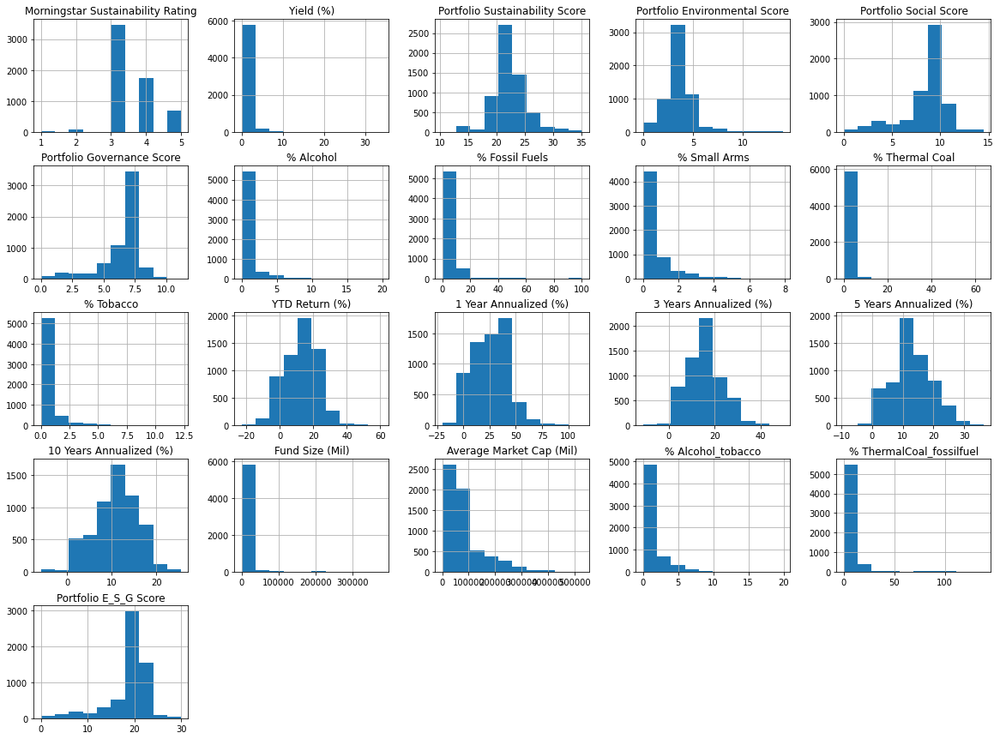

In [35]:
df.hist(figsize=(20,15))
plt.title("Distribution")

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 19.33it/s]


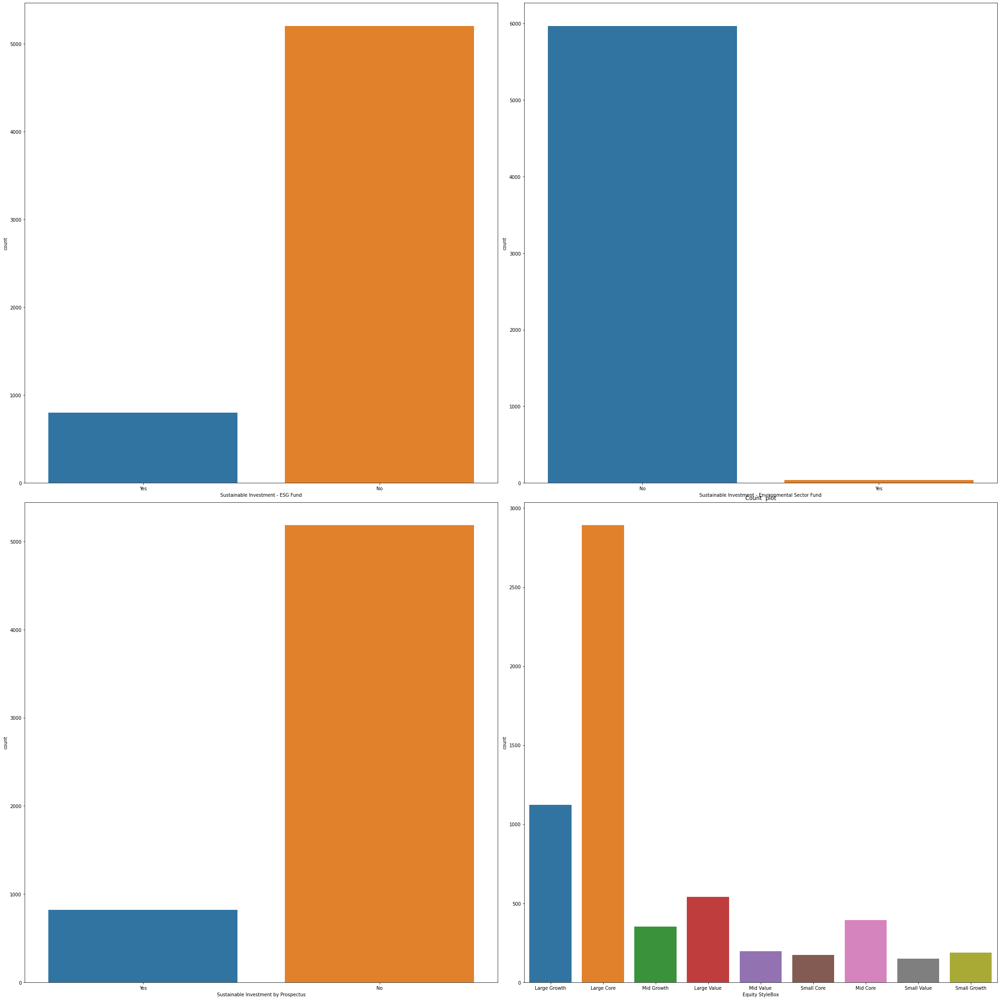

In [36]:
unilist = ['Sustainable Investment - ESG Fund', 'Sustainable Investment - Environmental Sector Fund', 'Sustainable Investment by Prospectus','Equity StyleBox']
n_cols = 2
n_rows = math.ceil(len(unilist)/n_cols)
# Check the distribution of x variable 
fig,ax = plt.subplots(nrows = n_rows, ncols = n_cols, figsize=(30,30))
row = 0
col = 0
for i in tqdm(unilist):
    if col > 1:
        row += 1
        col = 0
    axes = ax[row,col]
    sns.countplot(x = df[i], data= df, ax = axes)
    col += 1
plt.tight_layout()
plt.title("Count  plot")
plt.show()

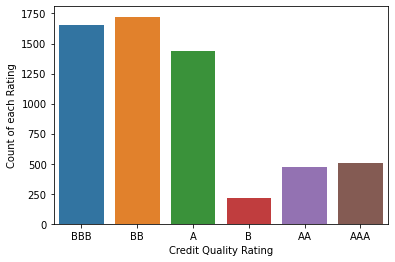

In [37]:
# Check distribution 
sns.countplot(x=df['Average Credit Quality'] ,data=df)
plt.ylabel("Count of each Rating")
plt.xlabel("Credit Quality Rating")
plt.show()

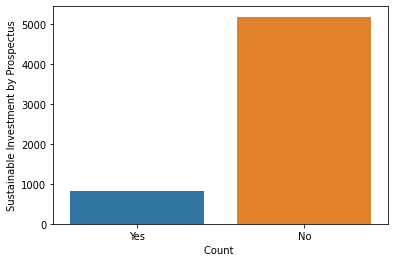

In [38]:
# Check distribution 
sns.countplot(x=df['Sustainable Investment by Prospectus'] ,data=df)
plt.xlabel("Count ")
plt.ylabel("Sustainable Investment by Prospectus")
plt.show()

In [39]:
df["Yield (%)"].describe()

count    6003.000000
mean        0.954195
std         1.257493
min         0.000000
25%         0.030000
50%         0.670000
75%         1.370000
max        34.080000
Name: Yield (%), dtype: float64

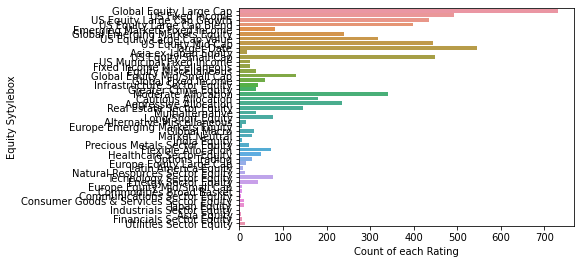

<Figure size 2520x1080 with 0 Axes>

In [40]:
# Check distribution 
sns.countplot(y=df['Morningstar Category'] ,data=df)
plt.xlabel("Count of each Rating")
plt.ylabel("Equity Sytylebox")
plt.figure(figsize = (35,15))
plt.show()

<AxesSubplot:>

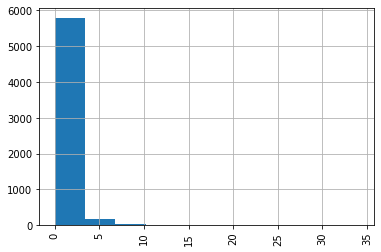

In [41]:
df['Yield (%)'].hist(xrot=90)

<AxesSubplot:>

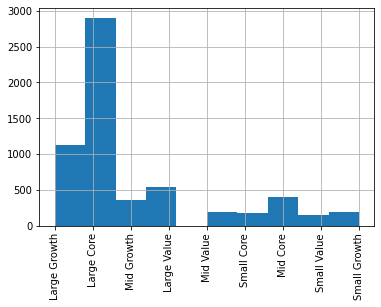

In [42]:
df['Equity StyleBox'].hist(xrot=90)

### **6.3 Bivariate Analysis**

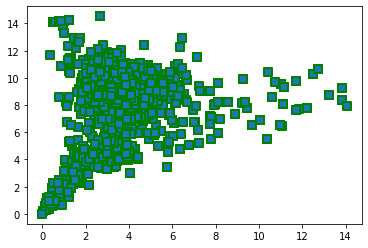

In [43]:
plt.scatter(x=df['Portfolio Environmental Score'], y=df['Portfolio Social Score'], 
            linewidths = 2, marker ="s", edgecolor ="green", s = 50)

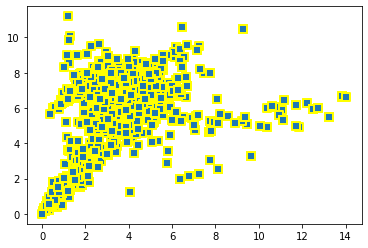

In [44]:
plt.scatter(x=df['Portfolio Environmental Score'], y=df['Portfolio Governance Score'], 
            linewidths = 2, marker ="s", edgecolor ="yellow", s = 50)

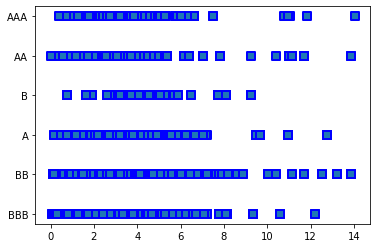

In [45]:
plt.scatter(x=df['Portfolio Environmental Score'], y=df['Average Credit Quality'], 
            linewidths = 2, marker ="s", edgecolor ="blue", s = 50)

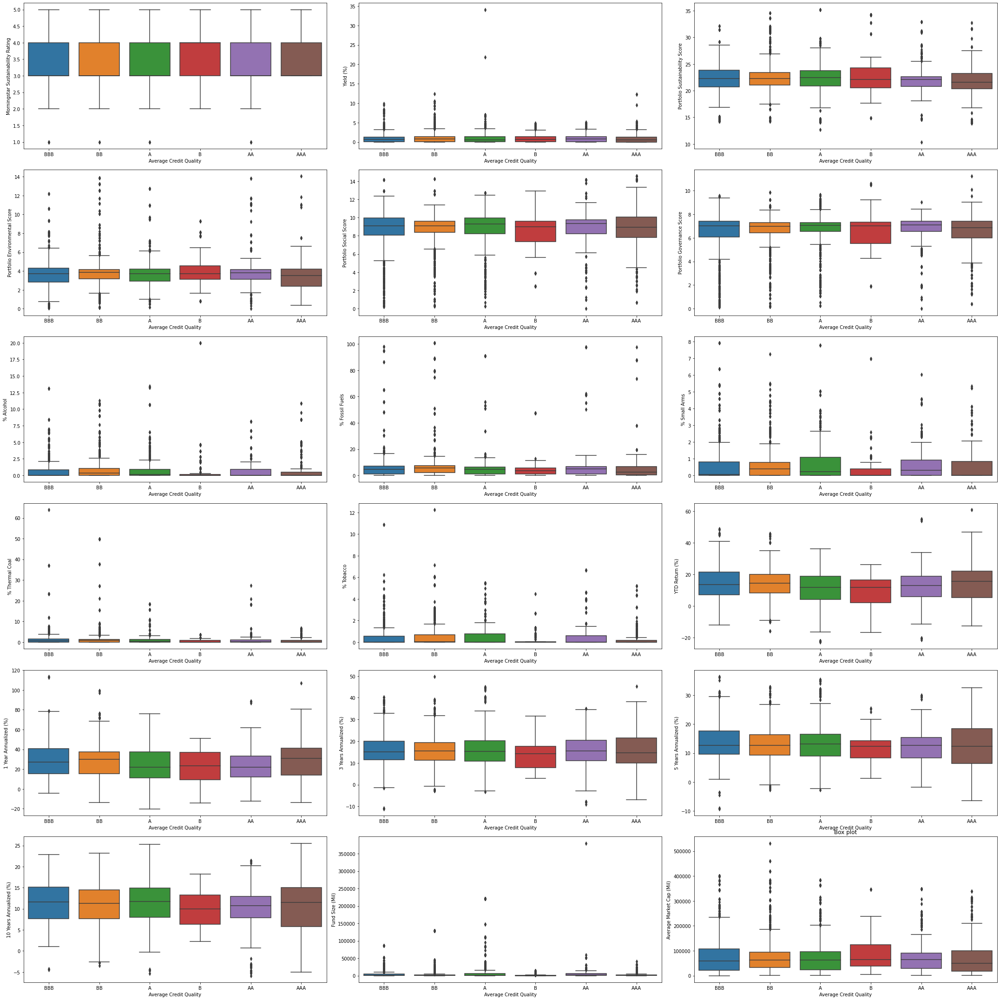

In [46]:
# Box plot of  differnt numerical features 
# Number of rows and columns in the plot
n_cols = 3
n_rows = math.ceil(len(numerical_columns)/n_cols)
# Check the distribution of y variable corresponding to every x variable 
fig,ax = plt.subplots(nrows = n_rows, ncols = n_cols, figsize=(30,30))
row = 0
col = 0
for i in numerical_columns:
    if col > 2:
        row += 1
        col = 0
    axes = ax[row,col]
    sns.boxplot(x = df['Average Credit Quality'], y = df[i],ax = axes)
    col += 1
plt.tight_layout()
plt.title("Box plot")
plt.show()

Text(0.5, 1.0, 'Distribution of the Categories wrt Rating ')

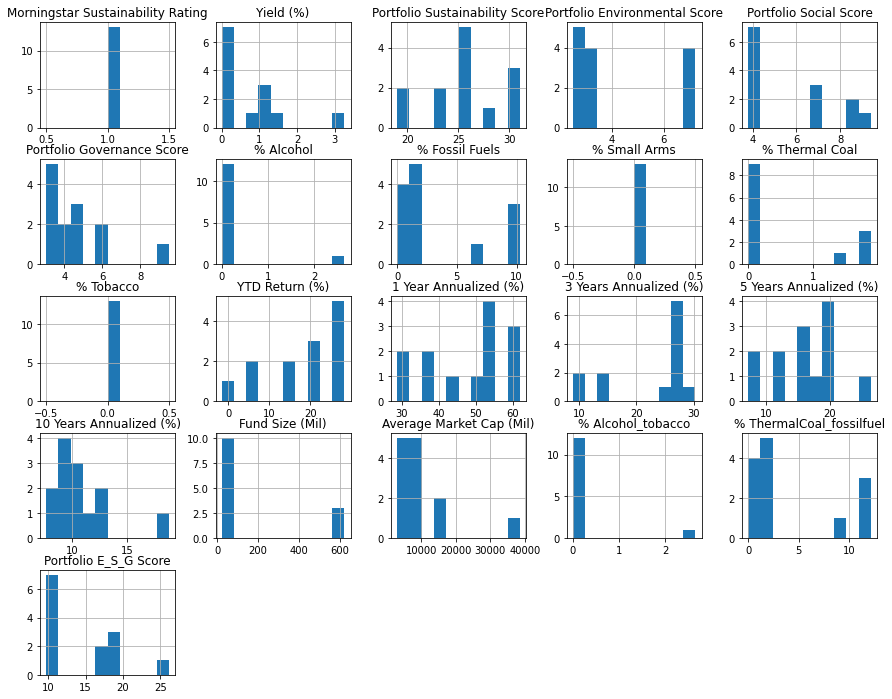

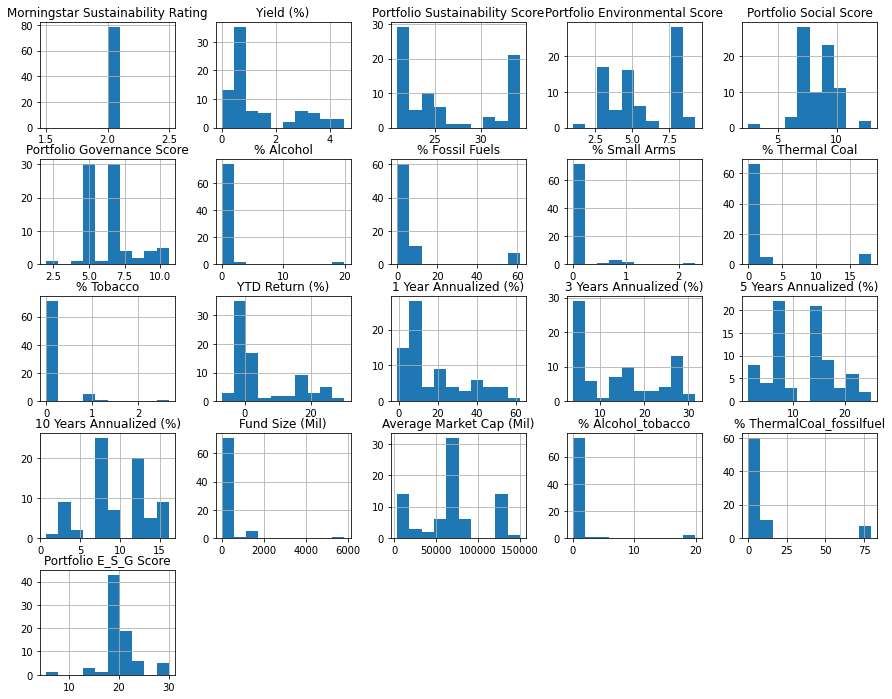

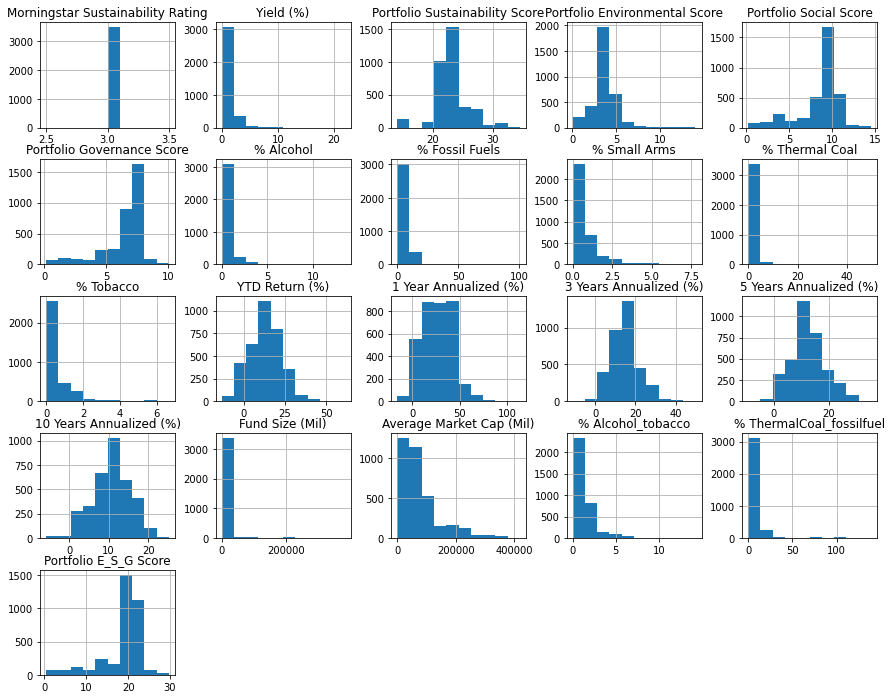

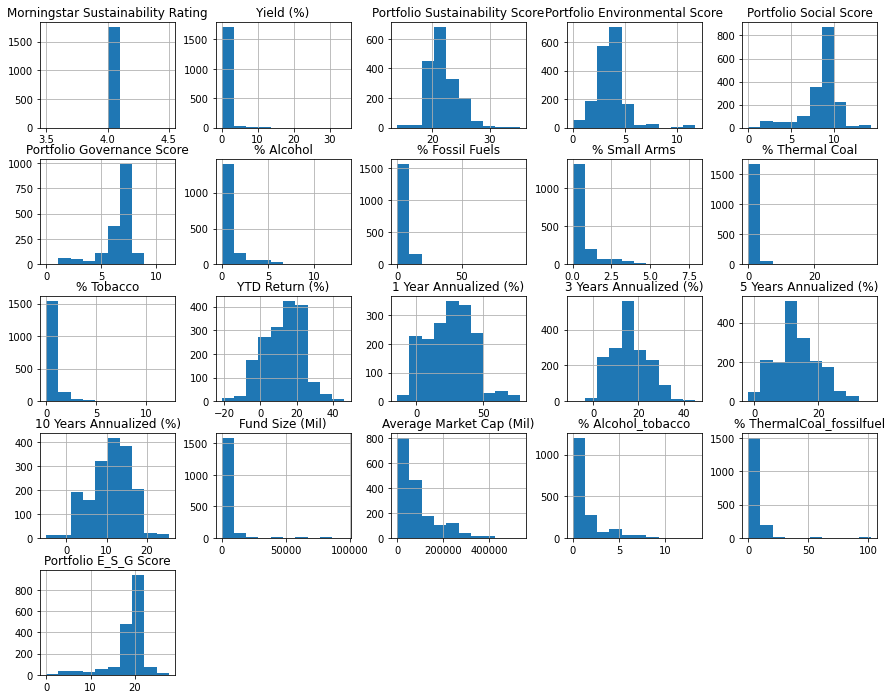

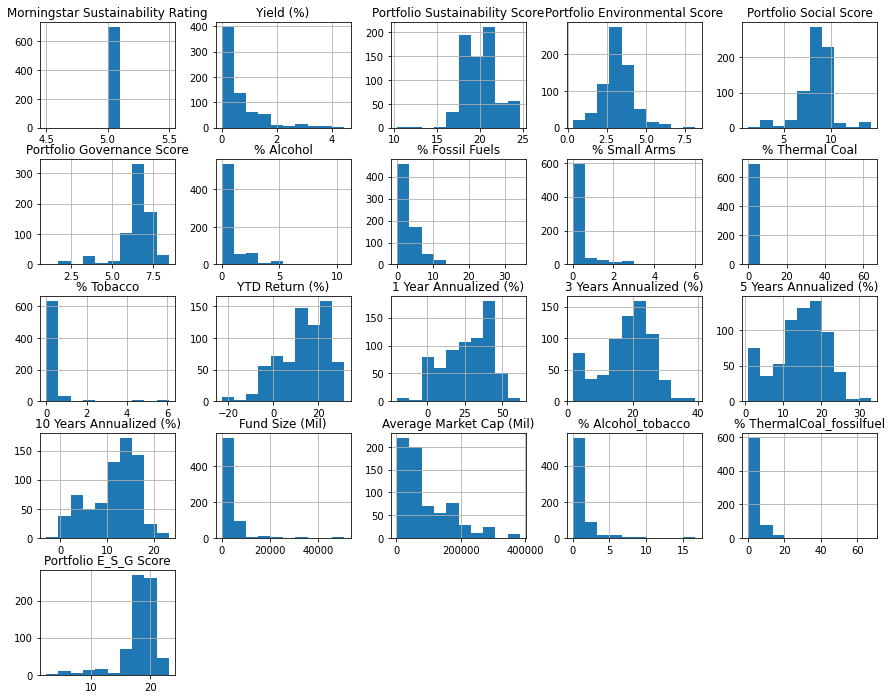

In [47]:
df.groupby('Morningstar Sustainability Rating').hist(figsize=(15,12))
plt.title("Distribution of the Categories wrt Rating ")

In [48]:
# Plot proportion of columns by data type using a pie chart
variables = {
    'categorical_columns': len(categorical_columns),    
    'numerical_columns': len(numerical_columns)
}

# Plot
pie_trace = go.Pie(labels=list(variables.keys()), values=list(variables.values()))
layout    = dict(title= "Variable types", height=400, width=800)
fig       = dict(data=[pie_trace], layout=layout)
py.iplot(fig)

In [49]:
# PLot cardinality
import plotly.offline as py
cardinality = []
for c in categorical_columns:
        if c!="Ticker":
            cardinality.append([c, df[c].nunique()])
            # Sort
            cardinality.sort(key=lambda x: x[1], reverse=False)
            # Plot
            trace = go.Bar(y=[x[0] for x in cardinality],
                       x=[x[1] for x in cardinality],
                       orientation='h', marker=dict(color='rgb(49,130,189)'), name='df')
            layout = go.Layout( title='Categorical cardinality', height=1600, width=800,
                     xaxis=dict(title='Number of categories',
                     titlefont=dict(size=16, color='rgb(107, 107, 107)'),
                     domain=[0.25, 1]), barmode='group', bargap=0.1, bargroupgap=0.1)
            
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig)

### ** 6.4 Handling of Outliers**

<AxesSubplot:>

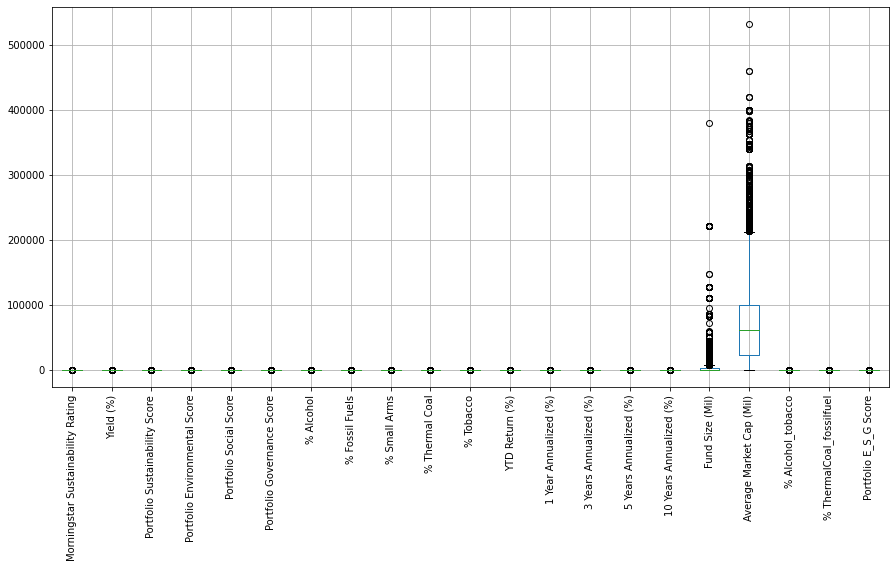

In [50]:
# Plotting boxplot to observe the outliers.
df.boxplot(rot=90, figsize = (15,7))

**Performing Operation to remove outliers**

In [51]:
print("Old training shape", df.shape)
list1 = df[['Fund Size (Mil)', 'Average Market Cap (Mil)']].columns
for cols in tq(list1):
    # Remove outliers
    #print(cols)
    Q1 = df[cols].quantile(0.25)
    Q3 = df[cols].quantile(0.75)
    IQR = Q3 - Q1
    upper = Q3+1.5*IQR
    lower = Q1-1.5*IQR
    #print(upper,lower)
    # Identify outliers
    outliers = [x for x in df[cols] if x < lower or x > upper]
    print('cols',cols)
    print('Identified outliers for : %d' % len(outliers))
    #print(df[[cols]])
    df[cols][df[cols] >= upper] = upper
    df[cols][df[cols] <= lower] = lower
    print("shape after outlier treatment", df.shape)    
    df

Old training shape (6003, 28)


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 19.57it/s]

cols Fund Size (Mil)
Identified outliers for : 810
shape after outlier treatment (6003, 28)
cols Average Market Cap (Mil)
Identified outliers for : 479
shape after outlier treatment (6003, 28)


<AxesSubplot:>

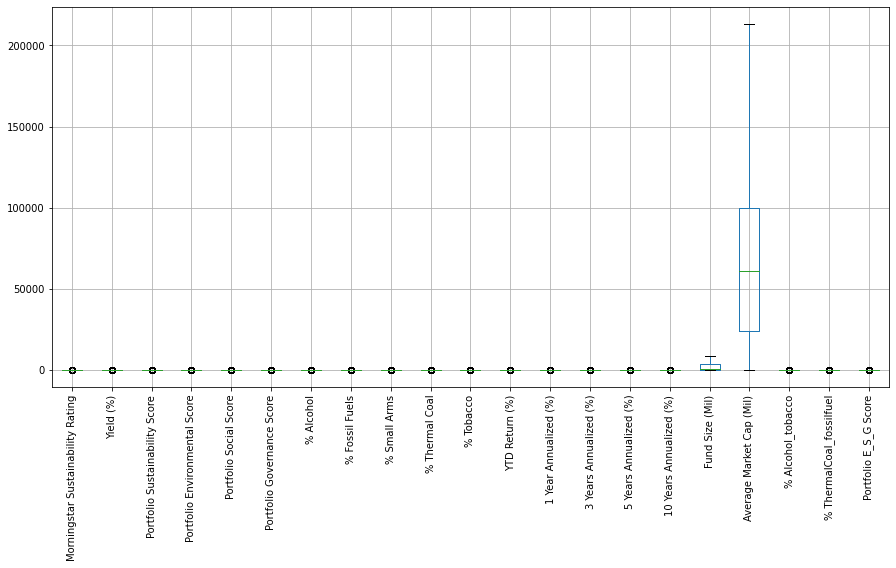

In [52]:
# Plotting the boxplot after removing outliers to check the features.
df.boxplot(rot=90, figsize = (15,7))

In [53]:
df.shape

(6003, 28)

## **7  Data Post Processing**


In [54]:
dfclean = df.copy()

In [55]:
# Dimentions of data
dfclean.shape

(6003, 28)

In [58]:
dfclean.head()

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality,% Alcohol_tobacco,% ThermalCoal_fossilfuel,Portfolio E_S_G Score
0,AWPCX,3.0,0.00,Global Equity Large Cap,20.67,4.21,8.13,6.92,Yes,Yes,No,0.0,3.73,0.0,1.90,0.0,8.22,24.74,19.32,12.27,7.50,941.47,Large Growth,32187.09,BBB,0.0,5.63,19.26
1,STHAX,5.0,0.67,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,No,0.0,8.24,0.0,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,Large Core,32187.09,BBB,0.0,10.49,18.28
2,STHYX,5.0,0.67,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,No,0.0,8.24,0.0,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,Large Core,32187.09,BBB,0.0,10.49,18.28
3,BJBIX,3.0,0.54,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,No,0.0,2.33,0.0,2.34,0.0,11.74,34.20,16.19,11.93,6.09,146.06,Large Growth,36331.08,BBB,0.0,4.67,18.52
4,JIEIX,3.0,0.83,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,No,0.0,2.33,0.0,2.34,0.0,11.99,34.56,16.49,12.20,6.36,146.06,Large Growth,36331.08,BBB,0.0,4.67,18.52


In [59]:
dfclean.columns

Index(['Ticker', 'Morningstar Sustainability Rating', 'Yield (%)',
       'Morningstar Category', 'Portfolio Sustainability Score',
       'Portfolio Environmental Score', 'Portfolio Social Score',
       'Portfolio Governance Score', 'Sustainable Investment by Prospectus',
       'Sustainable Investment - ESG Fund',
       'Sustainable Investment - Environmental Sector Fund', '% Alcohol',
       '% Fossil Fuels', '% Small Arms', '% Thermal Coal', '% Tobacco',
       'YTD Return (%)', '1 Year Annualized (%)', '3 Years Annualized (%)',
       '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)',
       'Equity StyleBox', 'Average Market Cap (Mil)', 'Average Credit Quality',
       '% Alcohol_tobacco', '% ThermalCoal_fossilfuel',
       'Portfolio E_S_G Score'],
      dtype='object')

In [60]:
len(dfclean.columns)

28

In [61]:
column_names = ['Ticker', 'Morningstar Sustainability Rating', 'Yield (%)',
                'Morningstar Category', 'Portfolio Sustainability Score',
                'Portfolio Environmental Score', 'Portfolio Social Score',
                'Portfolio Governance Score', 'Sustainable Investment by Prospectus',
                'Sustainable Investment - ESG Fund', 'Portfolio E_S_G Score',
                'Sustainable Investment - Environmental Sector Fund', '% Alcohol',
                '% Alcohol_tobacco', '% ThermalCoal_fossilfuel','% Fossil Fuels', 
                '% Small Arms', '% Thermal Coal', '% Tobacco', 'YTD Return (%)',
                '1 Year Annualized (%)', '3 Years Annualized (%)',
                '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)',
                'Equity StyleBox', 'Average Market Cap (Mil)', 'Average Credit Quality'
                ]

In [62]:
len(column_names)

28

In [63]:
dfclean = dfclean.reindex(columns=column_names)

In [64]:
dfclean.shape

(6003, 28)

# **8. Exploratory Data Analysis**

## What is the distribution of the ratings ?

In [65]:
dfclean['Morningstar Sustainability Rating'].value_counts()

3.0    3470
4.0    1746
5.0     696
2.0      78
1.0      13
Name: Morningstar Sustainability Rating, dtype: int64

###  Converting the column of yield% to median of the column.

In [66]:
dfclean["Yield (%)"] = dfclean["Yield (%)"].fillna(dfclean.groupby('Morningstar Category')['Yield (%)'].transform('median'))

### How many no of fund house/categories are there?

In [67]:
dfclean['Morningstar Category'].value_counts()

Global Equity Large Cap                    732
Target Date                                546
US Fixed Income                            492
US Equity Small Cap                        449
US Equity Mid Cap                          444
US Equity Large Cap Growth                 436
US Equity Large Cap Blend                  399
Moderate Allocation                        341
US Equity Large Cap Value                  317
Global Emerging Markets Equity             239
Aggressive Allocation                      236
Cautious Allocation                        180
Real Estate Sector Equity                  145
Global Equity Mid/Small Cap                130
Emerging Markets Fixed Income               82
Technology Sector Equity                    78
Long/Short Equity                           77
Flexible Allocation                         72
Global Fixed Income                         58
Healthcare Sector Equity                    49
Energy Sector Equity                        43
Infrastructur

###  What is the total fund size of all the fund houses/grps ?

In [68]:
print('Total fund size is:', round(dfclean['Fund Size (Mil)'].sum(), 2))

Total fund size is: 14333862.74


In [69]:
print('Total avg market cap size is:', round(dfclean['Average Market Cap (Mil)'].sum(), 2))

Total avg market cap size is: 450981442.53


In [70]:
numeric_df_correlation = pd.DataFrame(dfclean.corr()['Morningstar Sustainability Rating'])
abs(numeric_df_correlation).sort_values(by='Morningstar Sustainability Rating', ascending=False).T.style.background_gradient(cmap='viridis')

,Morningstar Sustainability Rating,Portfolio Sustainability Score,Portfolio Environmental Score,Yield (%),% Fossil Fuels,% ThermalCoal_fossilfuel,3 Years Annualized (%),5 Years Annualized (%),% Tobacco,% Small Arms,Average Market Cap (Mil),% Thermal Coal,% Alcohol,10 Years Annualized (%),Fund Size (Mil),Portfolio E_S_G Score,Portfolio Governance Score,YTD Return (%),1 Year Annualized (%),% Alcohol_tobacco,Portfolio Social Score
Morningstar Sustainability Rating,1.000000,0.348406,0.163830,0.151312,0.144466,0.144070,0.125735,0.111438,0.104492,0.099924,0.088390,0.086199,0.060877,0.059759,0.056722,0.044465,0.029264,0.020531,0.006342,0.004688,0.004103


In [71]:
dfgrp = dfclean.sort_values('Morningstar Sustainability Rating').groupby('Morningstar Sustainability Rating')['Yield (%)', 
                                        'Portfolio Sustainability Score', 
                                       '% Small Arms', 'YTD Return (%)', '1 Year Annualized (%)',
                                       '3 Years Annualized (%)', 'Fund Size (Mil)', 'Average Market Cap (Mil)',
                                       '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', 'Portfolio E_S_G Score'].agg(['sum','mean'])
dfgrp.T

Morningstar Sustainability Rating              1.0           2.0  \
Yield (%)                      sum        8.960000  1.022700e+02   
                               mean       0.689231  1.311154e+00   
Portfolio Sustainability Score sum      333.150000  2.056940e+03   
                               mean      25.626923  2.637103e+01   
% Small Arms                   sum        0.000000  7.420000e+00   
                               mean       0.000000  9.512821e-02   
YTD Return (%)                 sum      244.610000  3.958600e+02   
                               mean      18.816154  5.075128e+00   
1 Year Annualized (%)          sum      624.520000  1.355870e+03   
                               mean      48.040000  1.738295e+01   
3 Years Annualized (%)         sum      292.720000  1.146770e+03   
                               mean      22.516923  1.470218e+01   
Fund Size (Mil)                sum     2177.770000  2.343456e+04   
                               mean     167.520769  3.004431e+02   
Average Market Cap (Mil)       sum   128443.870000  5.249060e+06   
                               mean    9880.297692  6.729564e+04   
% Alcohol_tobacco              sum        2.650000  5.987000e+01   
                               mean       0.203846  7.675641e-01   
% ThermalCoal_fossilfuel       sum       52.040000  8.828700e+02   
                               mean       4.003077  1.131885e+01   
Portfolio E_S_G Score          sum      187.550000  1.583560e+03   
                               mean      14.426923  2.030205e+01   

Morningstar Sustainability Rating             3.0           4.0           5.0  
Yield (%)                      sum   3.837900e+03  1.366840e+03  4.120600e+02  
                               mean  1.106023e+00  7.828408e-01  5.920402e-01  
Portfolio Sustainability Score sum   7.961431e+04  3.827392e+04  1.399316e+04  
                               mean  2.294361e+01  2.192092e+01  2.010511e+01  
% Small Arms                   sum   2.418920e+03  1.053820e+03  1.989000e+02  
                               mean  6.970951e-01  6.035624e-01  2.857759e-01  
YTD Return (%)                 sum   4.576366e+04  2.195211e+04  9.616900e+03  
                               mean  1.318837e+01  1.257280e+01  1.381739e+01  
1 Year Annualized (%)          sum   9.228606e+04  4.407597e+04  1.872601e+04  
                               mean  2.659541e+01  2.524397e+01  2.690519e+01  
3 Years Annualized (%)         sum   5.208332e+04  2.823521e+04  1.257129e+04  
                               mean  1.500960e+01  1.617137e+01  1.806220e+01  
Fund Size (Mil)                sum   9.166230e+06  3.742845e+06  1.399175e+06  
                               mean  2.641565e+03  2.143669e+03  2.010309e+03  
Average Market Cap (Mil)       sum   2.474977e+08  1.384520e+08  5.965417e+07  
                               mean  7.132500e+04  7.929670e+04  8.571001e+04  
% Alcohol_tobacco              sum   4.135080e+03  2.213660e+03  7.061100e+02  
                               mean  1.191666e+00  1.267847e+00  1.014526e+00  
% ThermalCoal_fossilfuel       sum   2.816364e+04  1.033243e+04  2.304640e+03  
                               mean  8.116323e+00  5.917772e+00  3.311264e+00  
Portfolio E_S_G Score          sum   6.551464e+04  3.277705e+04  1.265659e+04  
                               mean  1.888030e+01  1.877265e+01  1.818476e+01

<AxesSubplot:xlabel='Morningstar Sustainability Rating'>

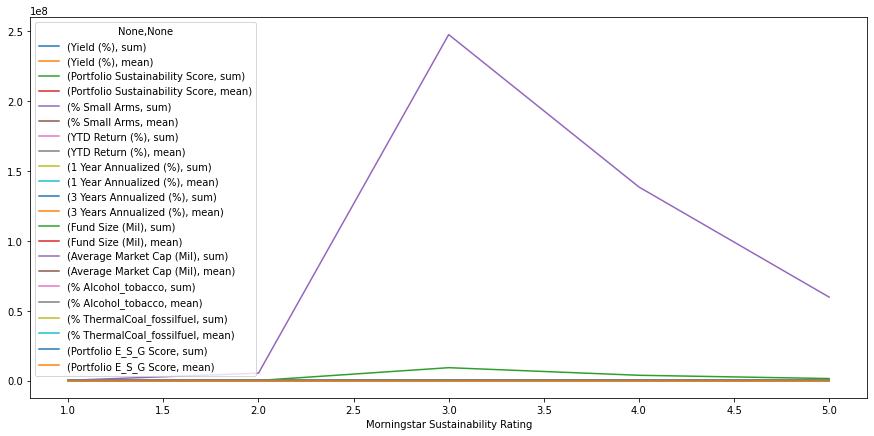

In [72]:
dfgrp.plot(kind='line',figsize=(15,7))

In [73]:
ratmean = pd.pivot_table(dfclean, values=[ 'Yield (%)', 'Portfolio Sustainability Score', '% Small Arms', 'YTD Return (%)', 
                                        '1 Year Annualized (%)',
                                       '3 Years Annualized (%)', 'Fund Size (Mil)', 'Average Market Cap (Mil)',
                                       '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', 'Portfolio E_S_G Score'], index=['Morningstar Sustainability Rating'], aggfunc=np.max)
print(len(ratmean))
ratmean

5


,% Alcohol_tobacco,% Small Arms,% ThermalCoal_fossilfuel,1 Year Annualized (%),3 Years Annualized (%),Average Market Cap (Mil),Fund Size (Mil),Portfolio E_S_G Score,Portfolio Sustainability Score,YTD Return (%),Yield (%)
Morningstar Sustainability Rating,,,,,,,,,,,
1.0,2.65,0.00,12.18,61.89,30.24,38586.4900,622.0100,26.14,31.06,28.39,3.26
2.0,19.97,2.31,79.38,62.02,31.63,149818.1800,5813.7100,29.98,34.23,30.20,4.54
3.0,14.21,7.77,138.60,113.53,49.75,213085.6925,8478.3925,29.75,34.58,60.97,21.85
4.0,13.23,7.91,102.03,77.21,45.15,213085.6925,8478.3925,27.67,35.20,46.16,34.08
5.0,16.71,6.02,67.57,61.64,39.17,213085.6925,8478.3925,23.13,24.66,31.61,4.46


In [74]:
grouped = dfclean.groupby('Morningstar Sustainability Rating')['Yield (%)', 'Portfolio Sustainability Score','% Small Arms', 'YTD Return (%)',
                                                          '1 Year Annualized (%)', '3 Years Annualized (%)', 'Fund Size (Mil)', 
                                                          'Average Market Cap (Mil)', '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', 'Portfolio E_S_G Score'].min()
grouped

,Yield (%),Portfolio Sustainability Score,% Small Arms,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),Fund Size (Mil),Average Market Cap (Mil),% Alcohol_tobacco,% ThermalCoal_fossilfuel,Portfolio E_S_G Score
Morningstar Sustainability Rating,,,,,,,,,,,
1.0,0.0,18.99,0.0,-1.66,28.81,8.95,21.34,2948.27,0.0,0.0,9.72
2.0,0.0,20.88,0.0,-7.08,-0.89,3.72,1.83,3701.13,0.0,0.0,5.46
3.0,0.0,14.02,0.0,-13.39,-15.82,-11.17,0.20,3.97,0.0,0.0,0.41
4.0,0.0,13.87,0.0,-21.35,-14.27,-8.98,0.05,137.92,0.0,0.0,0.00
5.0,0.0,10.38,0.0,-22.93,-20.12,1.63,1.40,2821.15,0.0,0.0,2.52


<AxesSubplot:xlabel='Morningstar Sustainability Rating'>

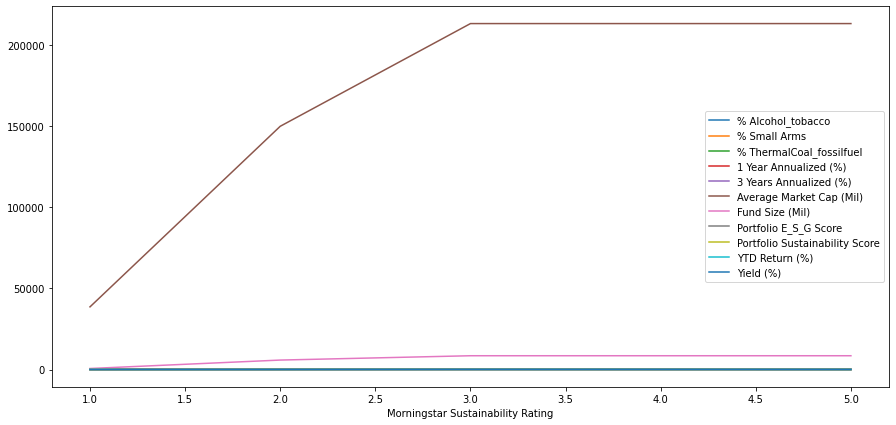

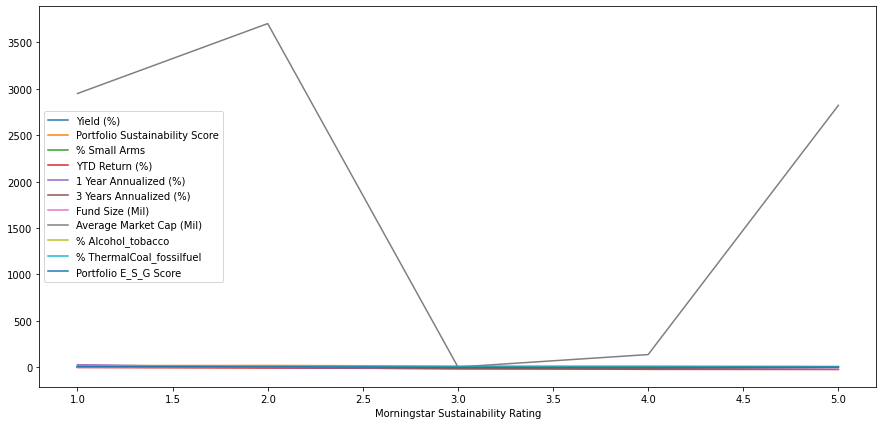

In [75]:
ratmean.plot(kind='line',figsize=(15,7))
grouped.plot(kind='line',figsize=(15,7))

In [76]:
#grouped.plot(kind='pie', y='Fund Size (Mil)', shadow = True, autopct='%1.1f%%', subplots=True)
# Plot

# Extract labels and values of rating type
labels = dfclean['Morningstar Sustainability Rating'].value_counts().index
values = dfclean['Morningstar Sustainability Rating'].value_counts().values

# Initiate an empty figure
fig = go.Figure()

# Add a trace of pie to the figure
fig.add_trace(trace=go.Pie(labels=labels,values=values))

# Update the layout 
fig.update_layout(height=500,width=1000,title_text='Proportion of Sustainability Rating ',title_x=0.5)

# Display the figure
fig.show()

In [77]:
dfclean[['Morningstar Sustainability Rating', 'Yield (%)', 'Portfolio Sustainability Score', '% Small Arms', 'YTD Return (%)', '1 Year Annualized (%)', '3 Years Annualized (%)',
    'Fund Size (Mil)', 'Average Market Cap (Mil)', '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', 'Portfolio E_S_G Score']][df["Sustainable Investment - Environmental Sector Fund"] == "No"]

,Morningstar Sustainability Rating,Yield (%),Portfolio Sustainability Score,% Small Arms,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),Fund Size (Mil),Average Market Cap (Mil),% Alcohol_tobacco,% ThermalCoal_fossilfuel,Portfolio E_S_G Score
0,3.0,0.00,20.67,0.00,8.22,24.74,19.32,941.47,32187.09,0.00,5.63,19.26
1,5.0,0.67,21.27,0.00,8.22,24.74,19.32,174.22,32187.09,0.00,10.49,18.28
2,5.0,0.67,21.27,0.00,8.22,24.74,19.32,174.22,32187.09,0.00,10.49,18.28
3,3.0,0.54,20.99,0.00,11.74,34.20,16.19,146.06,36331.08,0.00,4.67,18.52
4,3.0,0.83,20.99,0.00,11.99,34.56,16.49,146.06,36331.08,0.00,4.67,18.52
...,...,...,...,...,...,...,...,...,...,...,...,...
5998,3.0,3.36,24.02,1.73,6.33,13.04,7.78,639.55,74380.38,0.32,7.06,19.79
5999,3.0,3.52,24.02,1.73,6.57,13.30,7.89,639.55,74380.38,0.32,7.06,19.79
6000,3.0,2.60,24.02,1.73,5.80,12.14,7.00,639.55,74380.38,0.32,7.06,19.79
6001,3.0,3.77,24.02,1.73,6.63,13.41,8.11,639.55,74380.38,0.32,7.06,19.79


In [78]:
marketsum = dfclean.groupby(['Equity StyleBox','Morningstar Sustainability Rating'])
#marketsum = df.groupby(by=['Equity StyleBox','Morningstar Sustainability Rating'])['Fund Size (Mil)', 'Average Market Cap (Mil)'].agg(['sum','count'])
marketsum.head()
#marketsum.plot(kind='bar',figsize=(15,7))

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
0,AWPCX,3.0,0.00,Global Equity Large Cap,20.67,4.21,8.13,6.92,Yes,Yes,19.26,No,0.0,0.0,5.63,3.73,0.00,1.90,0.0,8.22,24.74,19.32,12.27,7.50,941.47,Large Growth,32187.09,BBB
1,STHAX,5.0,0.67,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,18.28,No,0.0,0.0,10.49,8.24,0.00,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,Large Core,32187.09,BBB
2,STHYX,5.0,0.67,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,18.28,No,0.0,0.0,10.49,8.24,0.00,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,Large Core,32187.09,BBB
3,BJBIX,3.0,0.54,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,18.52,No,0.0,0.0,4.67,2.33,0.00,2.34,0.0,11.74,34.20,16.19,11.93,6.09,146.06,Large Growth,36331.08,BBB
4,JIEIX,3.0,0.83,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,18.52,No,0.0,0.0,4.67,2.33,0.00,2.34,0.0,11.99,34.56,16.49,12.20,6.36,146.06,Large Growth,36331.08,BBB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1492,ARAIX,5.0,0.41,US Equity Mid Cap,20.57,3.21,7.64,6.46,No,No,17.31,No,0.0,0.0,1.45,1.45,0.00,0.00,0.0,25.56,36.57,14.65,12.26,14.50,3312.76,Mid Value,8227.50,BBB
1493,ARGFX,5.0,0.22,US Equity Mid Cap,20.57,3.21,7.64,6.46,No,No,17.31,No,0.0,0.0,1.45,1.45,0.00,0.00,0.0,25.20,36.14,14.28,11.92,14.15,3312.76,Mid Value,8227.50,BBB
1964,BIAVX,5.0,0.00,US Equity Large Cap Value,20.14,3.31,9.87,6.78,No,No,19.96,No,0.0,0.0,0.00,0.00,0.00,0.00,0.0,9.00,11.21,12.23,6.48,5.84,1156.05,Mid Value,27736.04,BBB
3464,FJACX,5.0,0.76,US Equity Small Cap,22.76,2.20,4.55,3.77,No,No,10.52,No,0.0,0.0,2.08,2.08,0.66,0.00,0.0,31.26,61.43,20.29,15.44,3.72,1527.87,Small Core,4288.19,AAA


In [79]:
marketsum.size().sum()

6003

In [80]:
marketsum.sum().reset_index().to_csv('fundsmarket.csv')

In [81]:
type(marketsum)

pandas.core.groupby.generic.DataFrameGroupBy

In [82]:
marketsum.describe()

Yield (%)            \
                                                      count      mean   
Equity StyleBox Morningstar Sustainability Rating                       
Large Core      1.0                                     1.0  0.670000   
                2.0                                    54.0  1.522407   
                3.0                                  1918.0  1.252477   
                4.0                                   653.0  1.176570   
                5.0                                   266.0  0.977256   
Large Growth    2.0                                     9.0  0.096667   
                3.0                                   383.0  0.137546   
                4.0                                   490.0  0.199041   
                5.0                                   242.0  0.190413   
Large Value     2.0                                     4.0  2.975000   
                3.0                                   327.0  1.962263   
                4.0                                   182.0  1.440220   
                5.0                                    26.0  1.018077   
Mid Core        1.0                                     5.0  1.658000   
                2.0                                     7.0  0.901429   
                3.0                                   230.0  1.218609   
                4.0                                   119.0  0.779580   
                5.0                                    32.0  0.518750   
Mid Growth      1.0                                     7.0  0.000000   
                2.0                                     2.0  0.405000   
                3.0                                   141.0  0.195674   
                4.0                                   126.0  0.231587   
                5.0                                    77.0  0.299870   
Mid Value       3.0                                   132.0  2.040833   
                4.0                                    57.0  1.486842   
                5.0                                     6.0  0.905000   
Small Core      2.0                                     2.0  0.085000   
                3.0                                   124.0  0.428065   
                4.0                                    33.0  0.424242   
                5.0                                    13.0  0.600769   
Small Growth    3.0                                   123.0  0.193333   
                4.0                                    50.0  0.005000   
                5.0                                    14.0  0.057143   
Small Value     3.0                                    92.0  0.947717   
                4.0                                    36.0  0.498333   
                5.0                                    20.0  1.291500   

                                                                           \
                                                        std   min     25%   
Equity StyleBox Morningstar Sustainability Rating                           
Large Core      1.0                                     NaN  0.67  0.6700   
                2.0                                1.227115  0.00  0.6700   
                3.0                                1.099623  0.00  0.6300   
                4.0                                1.746162  0.00  0.3600   
                5.0                                0.821302  0.00  0.3925   
Large Growth    2.0                                0.220737  0.00  0.0000   
                3.0                                0.291096  0.00  0.0000   
                4.0                                0.293199  0.00  0.0000   
                5.0                                0.303380  0.00  0.0000   
Large Value     2.0                                1.617416  0.67  2.4400   
                3.0                                1.345712  0.00  1.0900   
                4.0                                1.231079  0.00  0.9000   
                5.0                            

In [83]:
mcw = marketsum.get_group(('Small Core', 5))
mcw.head()

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
133,CGAFX,5.0,1.47,US Fixed Income,20.99,3.76,6.96,5.81,Yes,Yes,16.53,No,0.0,0.0,19.52,12.04,0.00,7.48,0.0,-1.75,-0.16,4.95,2.92,10.71,9.77,Small Core,5774.04,BBB
134,CGBIX,5.0,1.72,US Fixed Income,20.99,3.76,6.96,5.81,Yes,Yes,16.53,No,0.0,0.0,19.52,12.04,0.00,7.48,0.0,-1.54,0.09,5.21,3.23,10.71,9.77,Small Core,5774.04,BBB
135,CBGRX,5.0,1.77,US Fixed Income,20.99,3.76,6.96,5.81,Yes,Yes,16.53,No,0.0,0.0,19.52,12.04,0.00,7.48,0.0,-1.50,0.14,5.28,3.27,10.71,9.77,Small Core,5774.04,BBB
3464,FJACX,5.0,0.76,US Equity Small Cap,22.76,2.20,4.55,3.77,No,No,10.52,No,0.0,0.0,2.08,2.08,0.66,0.00,0.0,31.26,61.43,20.29,15.44,3.72,1527.87,Small Core,4288.19,AAA
3470,FSCRX,5.0,0.30,US Equity Small Cap,22.82,2.26,4.56,3.79,No,No,10.61,No,0.0,0.0,2.31,2.15,0.75,0.16,0.0,31.22,61.64,17.91,13.77,13.49,3364.39,Small Core,4504.00,AAA


In [84]:
marketsum[['Yield (%)','% Small Arms']].max()

Yield (%)  % Small Arms
Equity StyleBox Morningstar Sustainability Rating                         
Large Core      1.0                                     0.67          0.00
                2.0                                     4.54          0.93
                3.0                                    21.85          7.77
                4.0                                    34.08          7.24
                5.0                                     4.46          3.20
Large Growth    2.0                                     0.67          2.31
                3.0                                     2.48          4.81
                4.0                                     1.71          2.63
                5.0                                     1.17          2.62
Large Value     2.0                                     4.12          1.06
                3.0                                     7.54          6.36
                4.0                                     9.87          7.91
                5.0                                     1.91          6.02
Mid Core        1.0                                     3.26          0.00
                2.0                                     1.12          0.00
                3.0                                     5.96          1.94
                4.0                                     4.94          5.34
                5.0                                     1.78          0.52
Mid Growth      1.0                                     0.00          0.00
                2.0                                     0.67          0.00
                3.0                                     9.48          3.31
                4.0                                    10.49          1.62
                5.0                                     4.42          1.62
Mid Value       3.0                                    12.41          3.56
                4.0                                    12.31          2.48
                5.0                                     2.75          0.00
Small Core      2.0                                     0.17          0.00
                3.0                                     3.97          3.52
                4.0                                     1.13          2.72
                5.0                                     1.77          0.75
Small Growth    3.0                                     7.98          2.75
                4.0                                     0.14          1.62
                5.0                                     0.80          1.25
Small Value     3.0                                     5.28          5.51
                4.0                                     1.90          1.40
                5.0                                     3.90          2.21

In [85]:
marketsum[['% Small Arms','Yield (%)']].max()

% Small Arms  Yield (%)
Equity StyleBox Morningstar Sustainability Rating                         
Large Core      1.0                                        0.00       0.67
                2.0                                        0.93       4.54
                3.0                                        7.77      21.85
                4.0                                        7.24      34.08
                5.0                                        3.20       4.46
Large Growth    2.0                                        2.31       0.67
                3.0                                        4.81       2.48
                4.0                                        2.63       1.71
                5.0                                        2.62       1.17
Large Value     2.0                                        1.06       4.12
                3.0                                        6.36       7.54
                4.0                                        7.91       9.87
                5.0                                        6.02       1.91
Mid Core        1.0                                        0.00       3.26
                2.0                                        0.00       1.12
                3.0                                        1.94       5.96
                4.0                                        5.34       4.94
                5.0                                        0.52       1.78
Mid Growth      1.0                                        0.00       0.00
                2.0                                        0.00       0.67
                3.0                                        3.31       9.48
                4.0                                        1.62      10.49
                5.0                                        1.62       4.42
Mid Value       3.0                                        3.56      12.41
                4.0                                        2.48      12.31
                5.0                                        0.00       2.75
Small Core      2.0                                        0.00       0.17
                3.0                                        3.52       3.97
                4.0                                        2.72       1.13
                5.0                                        0.75       1.77
Small Growth    3.0                                        2.75       7.98
                4.0                                        1.62       0.14
                5.0                                        1.25       0.80
Small Value     3.0                                        5.51       5.28
                4.0                                        1.40       1.90
                5.0                                        2.21       3.90

###  What is the average return on investment over a period of 3, 5  and 10 years of investment ?

In [86]:
marketsum[['3 Years Annualized (%)', '5 Years Annualized (%)', '10 Years Annualized (%)']].mean()

3 Years Annualized (%)  \
Equity StyleBox Morningstar Sustainability Rating                           
Large Core      1.0                                             30.240000   
                2.0                                             11.291111   
                3.0                                             13.275115   
                4.0                                             11.908545   
                5.0                                             15.406579   
Large Growth    2.0                                             27.022222   
                3.0                                             24.013420   
                4.0                                             22.040714   
                5.0                                             20.871653   
Large Value     2.0                                              9.090000   
                3.0                                             10.990398   
                4.0                                             12.119011   
                5.0                                             15.527692   
Mid Core        1.0                                             22.322000   
                2.0                                             28.010000   
                3.0                                             14.763522   
                4.0                                             14.227395   
                5.0                                             14.360313   
Mid Growth      1.0                                             21.552857   
                2.0                                             15.765000   
                3.0                                             22.994184   
                4.0                                             24.111825   
                5.0                                             22.746623   
Mid Value       3.0                                              9.669545   
                4.0                                             10.866491   
                5.0                                             11.256667   
Small Core      2.0                                             14.945000   
                3.0                                             15.366532   
                4.0                                             15.206061   
                5.0                                             14.138462   
Small Growth    3.0                                             23.787967   
                4.0                                             21.779000   
                5.0                                             20.075714   
Small Value     3.0                                             11.794674   
                4.0                                             14.223056   
                5.0                                             13.753000   

                                                   5 Years Annualized (%)  \
Equity StyleBox Morningstar Sustainability Rating                           
Large Core      1.0                                             26.380000   
                2.0                                             10.811481   
                3.0                                             10.988848   
                4.0                                              9.696799   
                5.0                                             12.713083   
Large Growth    2.0                                             17.153333   
                3.0                                             20.378695   
                4.0                                             18.091429   
                5.0                                             17.171860   
Large Value     2.0                                              6.417500   
                3.0                                              9.605627   
                4.0                                             11.429121   
                5.0                           

<AxesSubplot:xlabel='Equity StyleBox,Morningstar Sustainability Rating'>

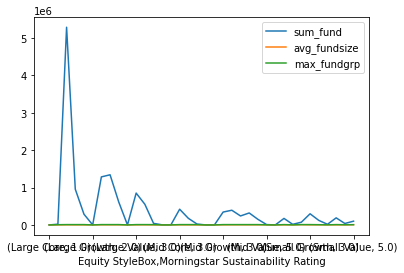

In [87]:
aggs = {'sum_fund': ('Fund Size (Mil)', 'sum'),
        'avg_fundsize': ('Fund Size (Mil)', 'mean'),
        'max_fundgrp': ('Fund Size (Mil)', 'max')}
marketsum.agg(**aggs).plot(kind='line')

In [88]:
def max_minus_min(x):
    return x.max() - x.min()
    #return x/x.sum()

df_range = marketsum[['Fund Size (Mil)', 'Average Market Cap (Mil)']].transform(max_minus_min).rename(columns={'Fund Size (Mil)': 'FundSize_range', 'Average Market Cap (Mil)': 'Avgmarketcap_range'})
df_range

,FundSize_range,Avgmarketcap_range
0,8478.1525,199406.3625
1,8476.1425,209806.3425
2,8476.1425,209806.3425
3,8478.1525,199406.3625
4,8478.1525,199406.3625
...,...,...
5998,8478.1925,212785.8525
5999,8478.1925,212785.8525
6000,8478.1925,212785.8525
6001,8478.1925,212785.8525


In [89]:
#grouped.plot(kind='pie', y='Fund Size (Mil)', shadow = True, autopct='%1.1f%%', subplots=True)
# Plot

# Extract labels and values of rating type
labels = marketsum['Morningstar Sustainability Rating'].value_counts().index
values = marketsum['Morningstar Sustainability Rating'].value_counts().values

# Initiate an empty figure
fig = go.Figure()

# Add a trace of pie to the figure
fig.add_trace(trace=go.Pie(labels=labels,values=values,hoverinfo='label+percent'))

# Update the layout 
fig.update_layout(height=700,width=1000,title_text='Proportion of Equity StyleBox Rating ',title_x=0.5)

# Display the figure
fig.show()

In [90]:
dfclean.columns

Index(['Ticker', 'Morningstar Sustainability Rating', 'Yield (%)',
       'Morningstar Category', 'Portfolio Sustainability Score',
       'Portfolio Environmental Score', 'Portfolio Social Score',
       'Portfolio Governance Score', 'Sustainable Investment by Prospectus',
       'Sustainable Investment - ESG Fund', 'Portfolio E_S_G Score',
       'Sustainable Investment - Environmental Sector Fund', '% Alcohol',
       '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', '% Fossil Fuels',
       '% Small Arms', '% Thermal Coal', '% Tobacco', 'YTD Return (%)',
       '1 Year Annualized (%)', '3 Years Annualized (%)',
       '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)',
       'Equity StyleBox', 'Average Market Cap (Mil)',
       'Average Credit Quality'],
      dtype='object')

In [91]:
equity_count = dfclean.groupby(by='Equity StyleBox').count()
marketcap_count = equity_count[['Average Market Cap (Mil)', 'Ticker', 'Morningstar Sustainability Rating', 'Yield (%)',
                                'Morningstar Category', 'Portfolio Sustainability Score',
                                'Sustainable Investment by Prospectus',
                                'Sustainable Investment - ESG Fund',                             
                                'Sustainable Investment - Environmental Sector Fund', 
                                '% Small Arms', 'YTD Return (%)', '1 Year Annualized (%)',
                                '3 Years Annualized (%)', 'Fund Size (Mil)', 
                                'Average Credit Quality','% Alcohol_tobacco', '% ThermalCoal_fossilfuel', 
                                'Portfolio E_S_G Score']].sort_values(by='Average Market Cap (Mil)', ascending=False)
marketcap_count

,Average Market Cap (Mil),Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Sustainable Investment - Environmental Sector Fund,% Small Arms,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),Fund Size (Mil),Average Credit Quality,% Alcohol_tobacco,% ThermalCoal_fossilfuel,Portfolio E_S_G Score
Equity StyleBox,,,,,,,,,,,,,,,,,,
Large Core,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892
Large Growth,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124
Large Value,539,539,539,539,539,539,539,539,539,539,539,539,539,539,539,539,539,539
Mid Core,393,393,393,393,393,393,393,393,393,393,393,393,393,393,393,393,393,393
Mid Growth,353,353,353,353,353,353,353,353,353,353,353,353,353,353,353,353,353,353
Mid Value,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195
Small Growth,187,187,187,187,187,187,187,187,187,187,187,187,187,187,187,187,187,187
Small Core,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172,172
Small Value,148,148,148,148,148,148,148,148,148,148,148,148,148,148,148,148,148,148


In [92]:
marketcap_count.size

162

<AxesSubplot:xlabel='Equity StyleBox'>

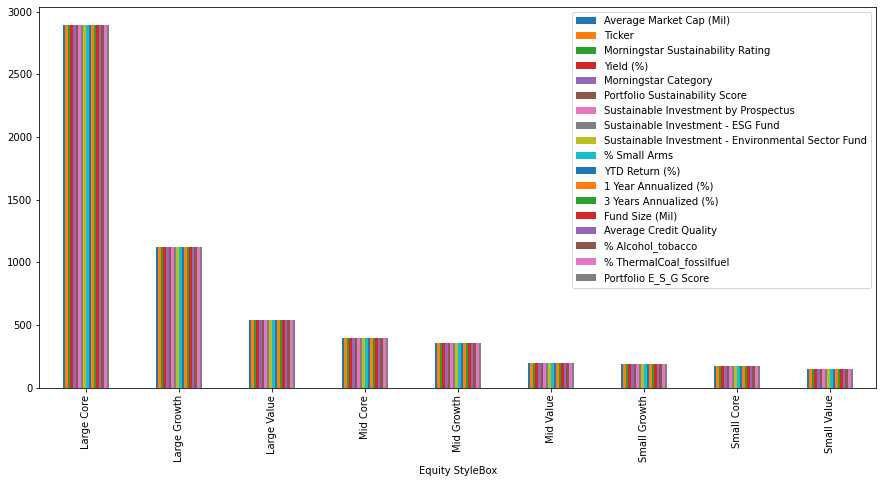

In [93]:
marketcap_count.plot(kind='bar', figsize=(15,7))

In [94]:
marketcap_count.shape

(9, 18)

In [95]:
dfclean.groupby(['Equity StyleBox']).agg({'Average Market Cap (Mil)' :[max,min,np.mean] ,'Fund Size (Mil)':[max,min,np.mean]})

Average Market Cap (Mil)                           \
                                     max       min           mean   
Equity StyleBox                                                     
Large Core                   213085.6925    137.92   86023.055065   
Large Growth                 213085.6925   7064.38  127475.705718   
Large Value                  213085.6925  12026.30   74912.882621   
Mid Core                      36305.9700   1985.75   15425.638499   
Mid Growth                    33592.8800   1427.60   16412.903796   
Mid Value                     37277.7600   2278.85   16054.681692   
Small Core                    25560.4800   2009.23    4400.561802   
Small Growth                   6703.4200   1787.21    4663.481925   
Small Value                  211225.3100      3.97   13016.004527   

                Fund Size (Mil)                      
                            max    min         mean  
Equity StyleBox                                      
Large Core            8478.3925   0.05  2264.012431  
Large Growth          8478.3925   0.21  2879.877431  
Large Value           8478.3925   1.55  2681.087250  
Mid Core              8478.3925   1.39  1589.404669  
Mid Growth            8478.3925   1.40  2766.205354  
Mid Value             8478.3925   4.14  2452.045449  
Small Core            8478.3925   9.77  1524.673968  
Small Growth          8478.3925  22.85  2329.761150  
Small Value           8478.3925   1.66  2210.039797

In [96]:
round(marketcap_count['Average Market Cap (Mil)'].sum(), 2)

6003

In [97]:
marketcap_count["Percentage Value"] = marketcap_count['Average Market Cap (Mil)']/marketcap_count['Fund Size (Mil)']

In [98]:
marketcap_count.head()

,Average Market Cap (Mil),Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Sustainable Investment - Environmental Sector Fund,% Small Arms,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),Fund Size (Mil),Average Credit Quality,% Alcohol_tobacco,% ThermalCoal_fossilfuel,Portfolio E_S_G Score,Percentage Value
Equity StyleBox,,,,,,,,,,,,,,,,,,,
Large Core,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,2892,1.0
Large Growth,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1124,1.0
Large Value,539,539,539,539,539,539,539,539,539,539,539,539,539,539,539,539,539,539,1.0
Mid Core,393,393,393,393,393,393,393,393,393,393,393,393,393,393,393,393,393,393,1.0
Mid Growth,353,353,353,353,353,353,353,353,353,353,353,353,353,353,353,353,353,353,1.0


In [99]:
dfclean[(dfclean['3 Years Annualized (%)'] >= 15) & (dfclean['Morningstar Sustainability Rating'] == 3)][['3 Years Annualized (%)','Fund Size (Mil)','Average Market Cap (Mil)']] 

,3 Years Annualized (%),Fund Size (Mil),Average Market Cap (Mil)
0,19.32,941.47,32187.09
3,16.19,146.06,36331.08
4,16.49,146.06,36331.08
10,25.00,539.90,33592.88
11,24.08,539.90,33592.88
...,...,...,...
5992,29.26,3088.74,12953.80
5993,29.40,3088.74,12953.80
5994,15.55,1245.02,56835.18
5995,15.66,1245.02,56835.18


<AxesSubplot:xlabel='Morningstar Category'>

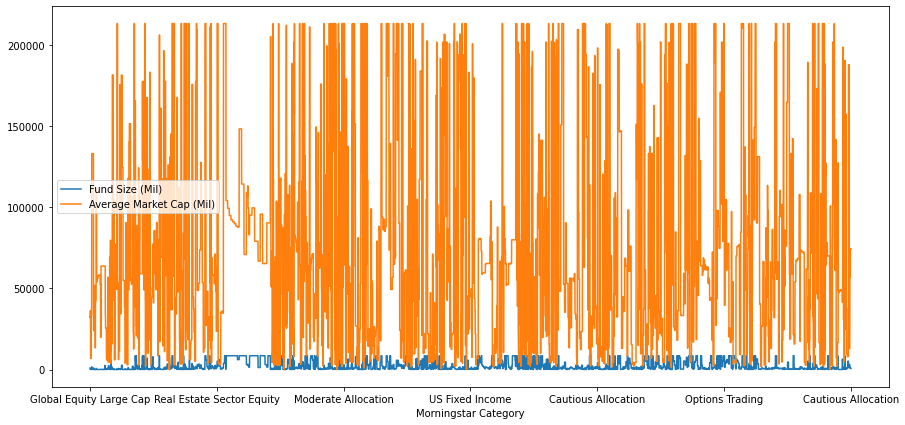

In [100]:
dfclean.plot(x='Morningstar Category', y=['Fund Size (Mil)','Equity StyleBox','Average Market Cap (Mil)'], kind="line", figsize = (15,7))

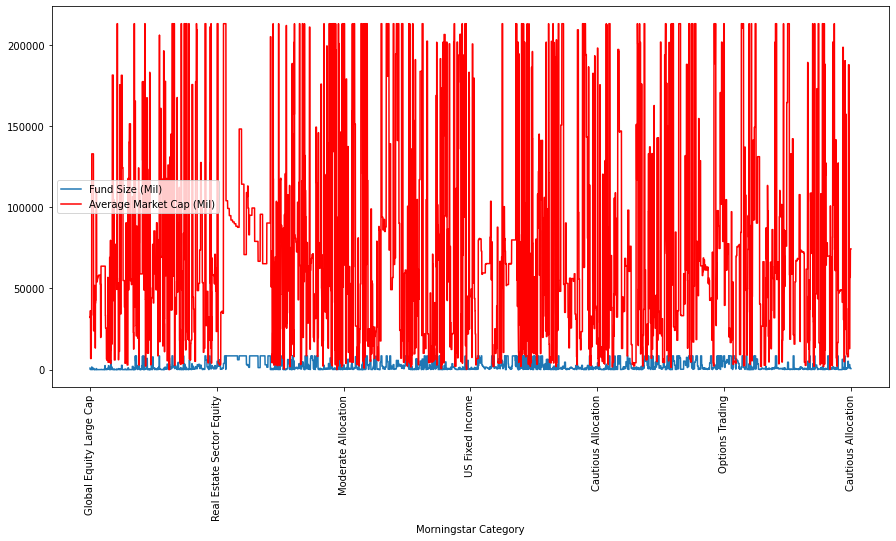

In [101]:
# gca stands for 'get current axis'
ax = plt.gca()
df.plot(kind='line',x='Morningstar Category',y='Fund Size (Mil)',ax=ax, rot=90, figsize = (15,7))
df.plot(kind='line',x='Morningstar Category',y='Average Market Cap (Mil)', color='red', ax=ax, rot = 90)
plt.show()

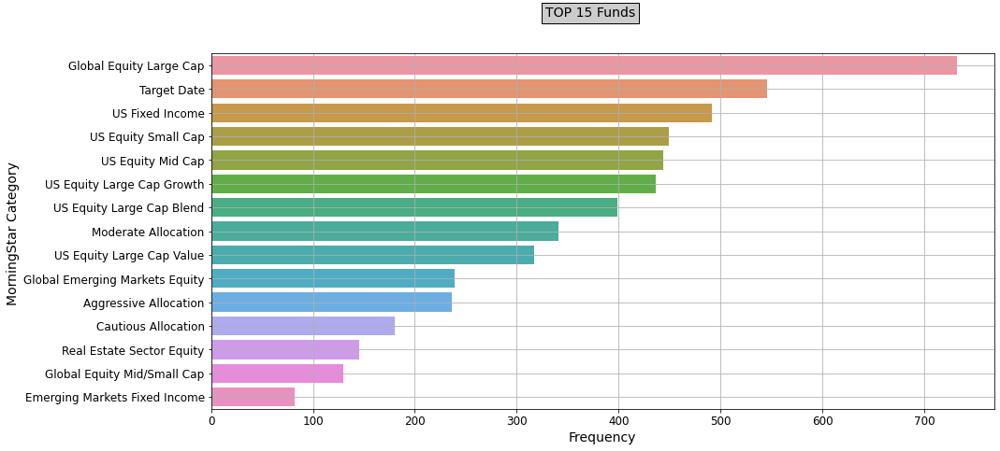

In [102]:
from collections import Counter  
# Get top 10 fund  and frequency
fundcount = Counter(dfclean['Morningstar Category'].dropna().tolist()).most_common(15)
country_idx = [ca[0] for ca in fundcount]
country_val = [ca[1] for ca in fundcount]

# Initiate an empty figure
fig = plt.figure(figsize=[15, 7])

# Plot the barplot figure
sns.barplot(x=country_val, y=country_idx)

# Add some cosmetics
plt.suptitle("TOP 15 Funds", bbox={'facecolor':'0.8'},fontsize = 14)
plt.xlabel(xlabel='Frequency', size=14)
plt.ylabel(ylabel='MorningStar Category ', size=14)

plt.xticks(size=12)
plt.yticks(size=12)
plt.grid(b=True)

# Output the figure
plt.show()

In [103]:
df12 = dfclean.groupby(['Morningstar Category','Fund Size (Mil)','Average Credit Quality','Average Market Cap (Mil)'])['Morningstar Sustainability Rating'].nunique().reset_index(name='count')

large = df12[df12['Morningstar Category'].str.contains('Large Cap')==True].sort_values(['count'], ascending=[False])
mid = df12[df12['Morningstar Category'].str.contains('Mid Cap')==True].sort_values(['count'], ascending=[False])
small = df12[df12['Morningstar Category'].str.contains('Small Cap')==True].sort_values(['count'], ascending=[False])

fig = make_subplots(rows=1, cols=3,subplot_titles=("Large Cap", "Mid Cap", " Small Cap"))


fig.add_trace(
    go.Funnel(
    y = df12['Average Credit Quality'],
    x = df12['count'],
    textposition = "inside",
    textinfo = "value+percent previous",
    marker = {"color": "#1c1847"}
),
    row=1, col=1
)

fig.add_trace(
    go.Funnel(
    y = df12['Average Credit Quality'],
    x = df12['count'],
    textposition = "inside",
    textinfo = "value+percent previous",
        marker = {"color": "#ff0000"}),row=1, col=2
)

fig.add_trace(
    go.Funnel(
    y = df12['Average Credit Quality'],
    x = df12['count'],
    textposition = "inside",
    textinfo = "value+percent previous",
        marker = {"color": "steelblue"}),row=1, col=3
)


fig.update_layout(showlegend=False,height=600, width=1000)
fig.show()

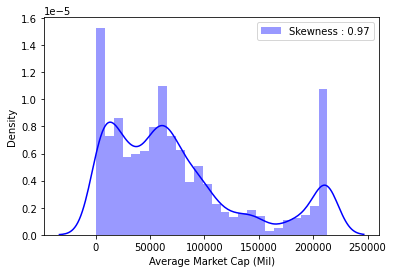

In [104]:
plot1=sns.distplot(dfclean["Average Market Cap (Mil)"], color="b", label="Skewness : %.2f"%(dfclean["Average Market Cap (Mil)"].skew()))
plot1.legend(loc="best")

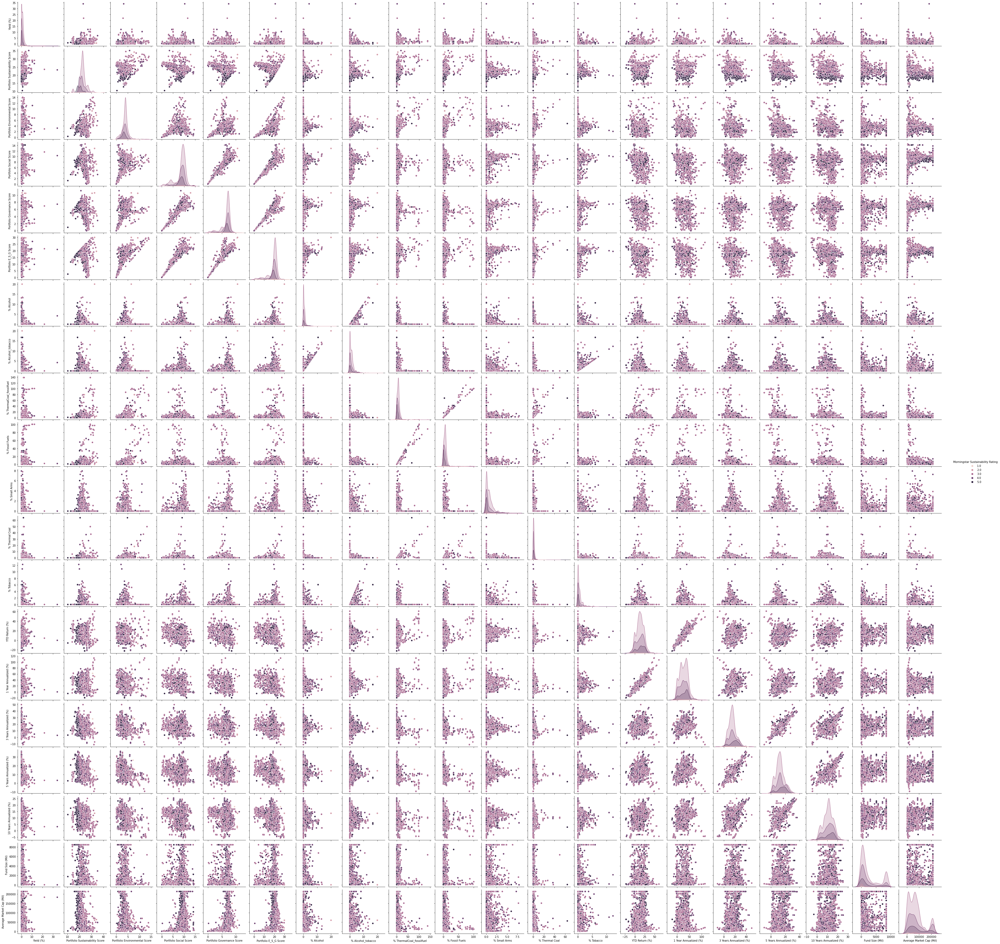

In [105]:
sns.pairplot(dfclean, hue='Morningstar Sustainability Rating', size=2.5)

In [106]:
largecap = dfclean[dfclean['Morningstar Category'].str.contains('Large Cap')==True]
largecap.shape

(1900, 28)

In [107]:
midcap = dfclean[dfclean['Morningstar Category'].str.contains('Mid Cap')==True]
midcap.shape

(444, 28)

In [108]:
smallcap = dfclean[dfclean['Morningstar Category'].str.contains('Small Cap')==True]
smallcap.shape

(585, 28)

In [109]:
balcap = dfclean[~(dfclean['Morningstar Category'].str.contains('Large Cap')==True) & ~(dfclean['Morningstar Category'].str.contains('Mid Cap')==True) & ~(dfclean['Morningstar Category'].str.contains('Small Cap')==True)]
balcap.shape

(3074, 28)

In [110]:
dfclean.shape

(6003, 28)

In [111]:
allocation_grp1 = df[df['Morningstar Category'].str.contains('Allocation')==True]
print(allocation_grp1.shape)
allocation_grp1.head(50)

(829, 28)


,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality,% Alcohol_tobacco,% ThermalCoal_fossilfuel,Portfolio E_S_G Score
286,MMAEX,4.0,0.67,Moderate Allocation,21.35,3.66,8.78,6.67,Yes,Yes,No,0.97,5.91,0.18,0.31,0.04,26.13,49.17,27.38,21.07,15.34,10.83,Large Core,50619.9800,BB,1.01,6.22,19.11
287,MMCEX,4.0,0.67,Moderate Allocation,21.35,3.66,8.78,6.67,Yes,Yes,No,0.97,5.91,0.18,0.31,0.04,26.13,49.17,27.38,21.07,15.34,10.83,Large Core,50619.9800,BB,1.01,6.22,19.11
288,MMTEX,4.0,0.67,Moderate Allocation,21.35,3.66,8.78,6.67,Yes,Yes,No,0.97,5.91,0.18,0.31,0.04,26.13,49.17,27.38,21.07,15.34,10.83,Large Core,50619.9800,BB,1.01,6.22,19.11
289,MMREX,4.0,0.67,Moderate Allocation,21.35,3.66,8.78,6.67,Yes,Yes,No,0.97,5.91,0.18,0.31,0.04,26.13,49.17,27.38,21.07,15.34,10.83,Large Core,50619.9800,BB,1.01,6.22,19.11
290,MMPEX,4.0,0.67,Moderate Allocation,21.35,3.66,8.78,6.67,Yes,Yes,No,0.97,5.91,0.18,0.31,0.04,26.13,49.17,27.38,21.07,15.34,10.83,Large Core,50619.9800,BB,1.01,6.22,19.11
388,PAXIX,5.0,0.95,Moderate Allocation,19.76,2.99,8.72,6.48,Yes,Yes,No,0.06,1.56,0.00,0.82,0.06,13.84,25.79,16.01,12.15,9.92,2541.62,Large Core,77897.6200,BBB,0.12,2.38,18.19
389,PAXWX,5.0,0.74,Moderate Allocation,19.76,2.99,8.72,6.48,Yes,Yes,No,0.06,1.56,0.00,0.82,0.06,13.57,25.47,15.73,11.86,9.64,2541.62,Large Core,77897.6200,BBB,0.12,2.38,18.19
397,PFJHX,4.0,0.67,Moderate Allocation,20.91,3.61,8.46,6.71,Yes,Yes,No,0.64,4.05,0.32,0.08,0.06,16.92,35.65,5.13,3.43,3.50,290.80,Large Core,58960.2200,A,0.70,4.13,18.78
415,AOBLX,4.0,0.92,Moderate Allocation,21.12,3.23,9.77,6.89,Yes,Yes,No,0.00,4.95,0.09,0.46,0.80,12.43,23.40,14.09,11.72,9.94,451.46,Large Core,128973.6900,B,0.80,5.41,19.89
416,PCBCX,4.0,0.24,Moderate Allocation,21.12,3.23,9.77,6.89,Yes,Yes,No,0.00,4.95,0.09,0.46,0.80,11.83,22.60,13.26,10.92,9.10,451.46,Large Core,128973.6900,B,0.80,5.41,19.89


In [112]:
largecap

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
0,AWPCX,3.0,0.00,Global Equity Large Cap,20.67,4.21,8.13,6.92,Yes,Yes,19.26,No,0.0,0.0,5.63,3.73,0.0,1.90,0.0,8.22,24.74,19.32,12.27,7.50,941.47,Large Growth,32187.09,BBB
3,BJBIX,3.0,0.54,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,18.52,No,0.0,0.0,4.67,2.33,0.0,2.34,0.0,11.74,34.20,16.19,11.93,6.09,146.06,Large Growth,36331.08,BBB
4,JIEIX,3.0,0.83,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,18.52,No,0.0,0.0,4.67,2.33,0.0,2.34,0.0,11.99,34.56,16.49,12.20,6.36,146.06,Large Growth,36331.08,BBB
5,MLSAX,1.0,0.00,US Equity Large Cap Growth,25.46,2.49,4.20,3.03,Yes,Yes,9.72,No,0.0,0.0,1.38,1.38,0.0,0.00,0.0,28.06,53.27,26.72,19.31,10.61,21.34,Mid Growth,6832.72,BBB
6,MLSCX,1.0,0.00,US Equity Large Cap Growth,25.46,2.49,4.20,3.03,Yes,Yes,9.72,No,0.0,0.0,1.38,1.38,0.0,0.00,0.0,26.89,51.76,25.77,18.41,9.82,21.34,Mid Growth,6832.72,BBB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5984,EVSYX,3.0,1.32,US Equity Large Cap Blend,21.63,3.80,10.04,7.72,No,No,21.56,No,0.0,0.4,7.50,6.30,0.0,1.20,0.4,25.37,43.80,20.18,17.17,15.53,1149.07,Large Core,187778.48,A
5985,EVSTX,3.0,0.44,US Equity Large Cap Blend,21.63,3.80,10.04,7.72,No,No,21.56,No,0.0,0.4,7.50,6.30,0.0,1.20,0.4,24.45,42.60,19.15,16.18,14.52,1149.07,Large Core,187778.48,A
5986,EVSIX,3.0,1.53,US Equity Large Cap Blend,21.63,3.80,10.04,7.72,No,No,21.56,No,0.0,0.4,7.50,6.30,0.0,1.20,0.4,25.67,44.24,20.49,17.47,15.82,1149.07,Large Core,187778.48,A
5987,EVSHX,3.0,1.18,US Equity Large Cap Blend,21.63,3.80,10.04,7.72,No,No,21.56,No,0.0,0.4,7.50,6.30,0.0,1.20,0.4,25.03,43.31,19.75,16.76,15.09,1149.07,Large Core,187778.48,A


In [113]:
print(largecap['% ThermalCoal_fossilfuel'].mean())
print(midcap['% ThermalCoal_fossilfuel'].mean())
print(smallcap['% ThermalCoal_fossilfuel'].mean())

5.374500000000015
5.390405405405415
3.356837606837611


In [114]:
large = largecap.loc[largecap['% ThermalCoal_fossilfuel'] > largecap['% ThermalCoal_fossilfuel'].mean()]
large_fossilfuel = large.loc[large['Sustainable Investment - ESG Fund'] == 'Yes'].reset_index(drop=True)

mid = midcap.loc[midcap['% ThermalCoal_fossilfuel'] > midcap['% ThermalCoal_fossilfuel'].mean()]
mid_fossilfuel = mid.loc[mid['Sustainable Investment - ESG Fund'] == 'Yes'].reset_index(drop=True)

small = smallcap.loc[smallcap['% ThermalCoal_fossilfuel'] > smallcap['% ThermalCoal_fossilfuel'].mean()]
small_fossilfuel = small.loc[small['Sustainable Investment - ESG Fund'] == 'Yes'].reset_index(drop=True)

print("Average value of % ThermalCoal_fossilfuel in large cap", largecap['% ThermalCoal_fossilfuel'].mean())
print('Out of {} large cap funds  surveyed, {} ({:.1%}) had investment in fossil fuel, thermal coals is greater than average value'
      .format(large.shape[0],
              large_fossilfuel.shape[0],
              large_fossilfuel.shape[0]/large.shape[0]))

print("Average value of % ThermalCoal_fossilfuel in mid cap", midcap['% ThermalCoal_fossilfuel'].mean())
print('Out of {} mid cap funds surveyed, {} ({:.1%}) had investment in fossil fuel, thermal coals  is greater than average value'
      .format(mid.shape[0],
              mid_fossilfuel.shape[0],
              mid_fossilfuel.shape[0]/mid.shape[0]))

print("Average value of % ThermalCoal_fossilfuel in small cap", smallcap['% ThermalCoal_fossilfuel'].mean())
print('Out of {} small cap funds surveyed, {} ({:.1%}) had investment in fossil fuel, thermal coals  is greater than average value'
      .format(small.shape[0],
              small_fossilfuel.shape[0],
              small_fossilfuel.shape[0]/small.shape[0]))

Average value of % ThermalCoal_fossilfuel in large cap 5.374500000000015
Out of 807 large cap funds  surveyed, 59 (7.3%) had investment in fossil fuel, thermal coals is greater than average value
Average value of % ThermalCoal_fossilfuel in mid cap 5.390405405405415
Out of 181 mid cap funds surveyed, 10 (5.5%) had investment in fossil fuel, thermal coals  is greater than average value
Average value of % ThermalCoal_fossilfuel in small cap 3.356837606837611
Out of 223 small cap funds surveyed, 22 (9.9%) had investment in fossil fuel, thermal coals  is greater than average value


In [115]:
largecap.describe()

,Morningstar Sustainability Rating,Yield (%),Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Portfolio E_S_G Score,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Average Market Cap (Mil)
count,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000,1900.000000
mean,3.647368,0.601989,20.688511,3.579221,9.288358,7.194579,20.062158,1.108405,1.629742,5.374500,4.634363,0.912753,0.740137,0.521337,17.540100,31.988058,19.100079,16.220526,12.890842,2623.128147,117363.046400
std,0.775391,0.775465,1.636862,0.932701,0.922173,0.548908,1.597173,1.954177,2.352293,5.122693,4.264098,1.293960,1.248162,1.102628,7.251752,11.750820,6.200961,5.347000,4.172133,3052.564569,65645.118974
min,1.000000,0.000000,16.820000,1.190000,4.200000,3.030000,9.720000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-8.150000,-3.100000,2.150000,1.320000,0.070000,0.210000,2131.560000
25%,3.000000,0.000000,19.800000,2.860000,8.620000,6.970000,19.110000,0.000000,0.000000,0.640000,0.640000,0.000000,0.000000,0.000000,11.987500,24.567500,14.390000,12.370000,10.070000,284.205000,59112.475000
50%,4.000000,0.410000,20.615000,3.580000,9.440000,7.260000,20.110000,0.000000,0.590000,4.465000,4.000000,0.200000,0.000000,0.000000,19.140000,33.840000,19.005000,16.075000,13.375000,1145.770000,100390.170000
75%,4.000000,0.950000,21.520000,4.230000,10.000000,7.530000,21.110000,1.577500,2.420000,8.560000,7.320000,1.380000,1.240000,0.630000,23.330000,41.320000,23.930000,20.192500,16.060000,4576.430000,190628.497500
max,5.000000,9.870000,34.230000,7.720000,11.630000,8.720000,23.470000,13.450000,16.710000,38.880000,20.410000,7.770000,21.160000,12.250000,33.740000,65.420000,40.230000,36.510000,21.700000,8478.392500,213085.692500


In [116]:
midcap

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
42,BBMIX,4.0,0.67,US Equity Mid Cap,21.72,4.59,8.24,6.29,Yes,Yes,19.12,No,0.0,0.0,0.00,0.00,0.0,0.0,0.0,23.79,50.87,14.20,12.46,10.28,14.58,Mid Growth,13274.53,B
174,LIFEX,1.0,0.00,US Equity Mid Cap,23.32,2.98,8.64,5.87,Yes,Yes,17.49,Yes,0.0,0.0,0.00,0.00,0.0,0.0,0.0,5.45,29.09,8.95,7.23,7.62,39.06,Mid Growth,15756.54,A
175,CAREX,1.0,0.00,US Equity Mid Cap,23.32,2.98,8.64,5.87,Yes,Yes,17.49,Yes,0.0,0.0,0.00,0.00,0.0,0.0,0.0,5.25,28.81,8.95,7.23,7.62,39.06,Mid Growth,15756.54,A
282,KESGX,2.0,0.17,US Equity Mid Cap,24.83,3.29,6.15,4.27,Yes,Yes,13.71,No,0.0,0.0,0.69,0.69,0.0,0.0,0.0,22.58,51.21,13.72,14.24,13.59,13.34,Small Core,5824.06,B
342,NEQCX,3.0,0.67,US Equity Mid Cap,21.28,4.52,9.19,6.04,Yes,Yes,19.75,No,0.0,0.0,4.63,4.63,0.0,0.0,0.0,18.52,38.78,18.29,15.86,13.86,6.49,Mid Core,23038.69,BB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5989,WFDAX,3.0,0.00,US Equity Mid Cap,24.36,2.20,7.51,4.77,No,No,14.48,No,0.0,0.0,0.00,0.00,0.0,0.0,0.0,5.43,30.93,28.84,24.50,17.24,3088.74,Mid Growth,12953.80,A
5990,WFDDX,3.0,0.00,US Equity Mid Cap,24.36,2.20,7.51,4.77,No,No,14.48,No,0.0,0.0,0.00,0.00,0.0,0.0,0.0,5.50,31.01,28.94,24.60,17.35,3088.74,Mid Growth,12953.80,A
5991,WDSCX,3.0,0.00,US Equity Mid Cap,24.36,2.20,7.51,4.77,No,No,14.48,No,0.0,0.0,0.00,0.00,0.0,0.0,0.0,4.77,29.93,27.90,23.58,16.37,3088.74,Mid Growth,12953.80,A
5992,WFDSX,3.0,0.00,US Equity Mid Cap,24.36,2.20,7.51,4.77,No,No,14.48,No,0.0,0.0,0.00,0.00,0.0,0.0,0.0,5.72,31.35,29.26,24.90,17.65,3088.74,Mid Growth,12953.80,A


In [117]:
midcap.head(30)

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
42,BBMIX,4.0,0.67,US Equity Mid Cap,21.72,4.59,8.24,6.29,Yes,Yes,19.12,No,0.00,0.00,0.00,0.00,0.00,0.00,0.0,23.79,50.87,14.20,12.46,10.28,14.5800,Mid Growth,13274.53,B
174,LIFEX,1.0,0.00,US Equity Mid Cap,23.32,2.98,8.64,5.87,Yes,Yes,17.49,Yes,0.00,0.00,0.00,0.00,0.00,0.00,0.0,5.45,29.09,8.95,7.23,7.62,39.0600,Mid Growth,15756.54,A
175,CAREX,1.0,0.00,US Equity Mid Cap,23.32,2.98,8.64,5.87,Yes,Yes,17.49,Yes,0.00,0.00,0.00,0.00,0.00,0.00,0.0,5.25,28.81,8.95,7.23,7.62,39.0600,Mid Growth,15756.54,A
282,KESGX,2.0,0.17,US Equity Mid Cap,24.83,3.29,6.15,4.27,Yes,Yes,13.71,No,0.00,0.00,0.69,0.69,0.00,0.00,0.0,22.58,51.21,13.72,14.24,13.59,13.3400,Small Core,5824.06,B
342,NEQCX,3.0,0.67,US Equity Mid Cap,21.28,4.52,9.19,6.04,Yes,Yes,19.75,No,0.00,0.00,4.63,4.63,0.00,0.00,0.0,18.52,38.78,18.29,15.86,13.86,6.4900,Mid Core,23038.69,BB
343,NEQIX,3.0,0.67,US Equity Mid Cap,21.28,4.52,9.19,6.04,Yes,Yes,19.75,No,0.00,0.00,4.63,4.63,0.00,0.00,0.0,18.52,38.78,18.29,15.86,13.86,6.4900,Mid Core,23038.69,BB
344,NALFX,3.0,4.64,US Equity Mid Cap,21.28,4.52,9.19,6.04,Yes,Yes,19.75,Yes,0.00,0.00,41.68,36.50,0.00,5.18,0.0,-0.23,29.92,32.40,19.87,14.17,480.1400,Mid Core,12605.69,BB
363,PFPRX,5.0,0.08,US Equity Mid Cap,18.81,2.05,9.24,6.41,Yes,Yes,17.70,No,0.00,0.00,0.00,0.00,0.00,0.00,0.0,11.87,32.56,20.39,16.56,16.08,1189.7800,Mid Growth,27409.72,BBB
364,PARNX,5.0,0.08,US Equity Mid Cap,18.81,2.05,9.24,6.41,Yes,Yes,17.70,No,0.00,0.00,0.00,0.00,0.00,0.00,0.0,11.74,32.37,20.21,16.38,15.97,1189.7800,Mid Growth,27409.72,BBB
365,PFPMX,5.0,0.32,US Equity Mid Cap,20.22,3.91,9.12,6.16,Yes,Yes,19.19,No,0.00,0.00,5.59,2.76,0.00,2.83,0.0,11.89,30.28,16.34,13.83,13.64,8478.3925,Mid Core,20758.22,BBB


In [118]:
smallcap.head()

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
114,BAFYX,4.0,0.67,US Equity Small Cap,19.80,2.73,9.22,5.71,Yes,Yes,17.66,No,0.00,0.00,5.10,3.51,0.00,1.59,0.0,-0.25,1.19,6.48,8.36,7.41,18.63,Large Core,63735.46,BBB
115,BIAYX,4.0,0.67,US Equity Small Cap,19.80,2.73,9.22,5.71,Yes,Yes,17.66,No,0.00,0.00,5.10,3.51,0.00,1.59,0.0,-0.25,1.19,6.48,8.36,7.41,18.63,Large Core,63735.46,BBB
142,COICX,4.0,0.00,Global Equity Mid/Small Cap,22.06,3.76,6.33,5.34,Yes,Yes,15.43,No,0.02,0.02,0.78,0.72,0.01,0.06,0.0,13.29,33.04,14.13,12.98,9.97,529.12,Mid Growth,4564.26,BB
153,QUSVX,5.0,0.98,US Equity Small Cap,23.04,3.32,6.31,5.56,Yes,Yes,15.19,No,0.00,0.00,10.70,8.59,0.00,2.11,0.0,30.50,52.84,6.89,8.87,9.32,20.75,Mid Value,7775.94,BBB
154,QSVIX,5.0,1.07,US Equity Small Cap,23.04,3.32,6.31,5.56,Yes,Yes,15.19,No,0.00,0.00,10.70,8.59,0.00,2.11,0.0,30.81,53.19,7.23,9.16,9.59,20.75,Mid Value,7775.94,BBB


In [119]:
dftarget = dfclean.loc[dfclean['Morningstar Category'].str.contains('Target Date')==True]
dftarget

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
53,LEBIX,5.0,1.41,Target Date,21.33,3.50,8.99,6.59,Yes,Yes,19.08,No,1.03,1.10,5.08,5.01,0.38,0.07,0.07,8.60,19.36,21.46,18.68,10.28,2.92,Large Core,53926.48,A
54,LELAX,5.0,1.26,Target Date,21.33,3.50,8.99,6.59,Yes,Yes,19.08,No,1.03,1.10,5.08,5.01,0.38,0.07,0.07,8.35,19.19,21.46,18.68,10.28,2.92,Large Core,53926.48,A
55,LEBKX,5.0,1.46,Target Date,21.33,3.50,8.99,6.59,Yes,Yes,19.08,No,1.03,1.10,5.08,5.01,0.38,0.07,0.07,8.65,19.42,21.46,18.68,10.28,2.92,Large Core,53926.48,A
56,LENIX,5.0,1.40,Target Date,21.30,3.62,8.83,6.67,Yes,Yes,19.12,No,1.03,1.12,5.53,5.43,0.42,0.10,0.09,11.02,24.34,21.46,18.68,10.28,3.69,Large Core,54670.50,A
57,LENAX,5.0,1.25,Target Date,21.30,3.62,8.83,6.67,Yes,Yes,19.12,No,1.03,1.12,5.53,5.43,0.42,0.10,0.09,10.74,24.17,21.46,18.68,10.28,3.69,Large Core,54670.50,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5929,WTSZX,3.0,1.50,Target Date,22.83,3.89,8.83,6.83,No,No,19.55,No,0.95,1.60,9.25,8.06,0.87,1.19,0.65,17.02,36.06,15.84,14.17,21.55,7.77,Large Core,49236.37,A
5930,WDYAX,3.0,1.45,Target Date,22.71,3.66,8.99,6.52,No,No,19.17,No,0.56,1.01,8.44,7.04,0.58,1.40,0.45,7.05,15.01,9.95,7.87,21.55,7.56,Large Core,48949.54,A
5931,WDYCX,3.0,1.16,Target Date,22.71,3.66,8.99,6.52,No,No,19.17,No,0.56,1.01,8.44,7.04,0.58,1.40,0.45,6.30,14.10,9.65,7.37,21.55,7.56,Large Core,48949.54,A
5932,WDYYX,3.0,1.74,Target Date,22.71,3.66,8.99,6.52,No,No,19.17,No,0.56,1.01,8.44,7.04,0.58,1.40,0.45,7.31,15.33,10.30,8.19,21.55,7.56,Large Core,48949.54,A


In [120]:
dfclean[dfclean['Morningstar Category'].str.contains('Target Date')==True]

,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
53,LEBIX,5.0,1.41,Target Date,21.33,3.50,8.99,6.59,Yes,Yes,19.08,No,1.03,1.10,5.08,5.01,0.38,0.07,0.07,8.60,19.36,21.46,18.68,10.28,2.92,Large Core,53926.48,A
54,LELAX,5.0,1.26,Target Date,21.33,3.50,8.99,6.59,Yes,Yes,19.08,No,1.03,1.10,5.08,5.01,0.38,0.07,0.07,8.35,19.19,21.46,18.68,10.28,2.92,Large Core,53926.48,A
55,LEBKX,5.0,1.46,Target Date,21.33,3.50,8.99,6.59,Yes,Yes,19.08,No,1.03,1.10,5.08,5.01,0.38,0.07,0.07,8.65,19.42,21.46,18.68,10.28,2.92,Large Core,53926.48,A
56,LENIX,5.0,1.40,Target Date,21.30,3.62,8.83,6.67,Yes,Yes,19.12,No,1.03,1.12,5.53,5.43,0.42,0.10,0.09,11.02,24.34,21.46,18.68,10.28,3.69,Large Core,54670.50,A
57,LENAX,5.0,1.25,Target Date,21.30,3.62,8.83,6.67,Yes,Yes,19.12,No,1.03,1.12,5.53,5.43,0.42,0.10,0.09,10.74,24.17,21.46,18.68,10.28,3.69,Large Core,54670.50,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5929,WTSZX,3.0,1.50,Target Date,22.83,3.89,8.83,6.83,No,No,19.55,No,0.95,1.60,9.25,8.06,0.87,1.19,0.65,17.02,36.06,15.84,14.17,21.55,7.77,Large Core,49236.37,A
5930,WDYAX,3.0,1.45,Target Date,22.71,3.66,8.99,6.52,No,No,19.17,No,0.56,1.01,8.44,7.04,0.58,1.40,0.45,7.05,15.01,9.95,7.87,21.55,7.56,Large Core,48949.54,A
5931,WDYCX,3.0,1.16,Target Date,22.71,3.66,8.99,6.52,No,No,19.17,No,0.56,1.01,8.44,7.04,0.58,1.40,0.45,6.30,14.10,9.65,7.37,21.55,7.56,Large Core,48949.54,A
5932,WDYYX,3.0,1.74,Target Date,22.71,3.66,8.99,6.52,No,No,19.17,No,0.56,1.01,8.44,7.04,0.58,1.40,0.45,7.31,15.33,10.30,8.19,21.55,7.56,Large Core,48949.54,A


In [121]:
large_cap = ColumnDataSource(dfclean[dfclean['Morningstar Category'].str.contains('Large Cap')==True])
mid_cap =  ColumnDataSource(dfclean[dfclean['Morningstar Category'].str.contains('Mid Cap')==True])
small_cap = ColumnDataSource(dfclean[dfclean['Morningstar Category'].str.contains('Small Cap')==True])

In [122]:
source=ColumnDataSource(dfclean)
large_cap = ColumnDataSource(dfclean[dfclean['Morningstar Category'].str.contains('Large Cap')==True])
mid_cap = ColumnDataSource(dfclean[dfclean['Morningstar Category'].str.contains('Mid Cap')==True])
small_cap = ColumnDataSource(dfclean[dfclean['Morningstar Category'].str.contains('Small Cap')==True])

p = figure(plot_height=400, plot_width=800, title='Fund Size (Mil) Vs Average Market Cap (Mil)', x_axis_label='Fund Size (Mil)', y_axis_label='Average Market Cap (Mil)')

# Add the first circle glyph to the figure p
p.circle('Fund Size (Mil)', 'Average Market Cap (Mil)', source=large_cap, size=10, color='red', legend_label='large_cap')

# Add the second circle glyph to the figure p
p.circle('Fund Size (Mil)', 'Average Market Cap (Mil)', source=mid_cap, size=10, color='blue', legend_label='mid_cap')

# Add the third circle glyph to the figure p
p.circle('Fund Size (Mil)', 'Average Market Cap (Mil)', source=small_cap, size=10, color='brown', legend_label='small_cap')


hover = HoverTool(tooltips = [('Average Market Cap (Mil)', '@{Average Market Cap (Mil)}{0.2f}'),
                             ('Fund Size (Mil)', '@{Fund Size (Mil)}{0.2f}'),
                             ('Morningstar Sustainability Rating','@{Morningstar Sustainability Rating}'),
                             ('1 Year Annualized (%)','@{1 Year Annualized (%)}{0.2f}'),
                             ('3 Years Annualized (%)','@{3 Years Annualized (%)}{0.2f}'),
                             ('5 Years Annualized (%)','@{5 Years Annualized (%)}{0.2f}'),
                             ('10 Years Annualized (%)','@{10 Years Annualized (%)}{0.2f}'),                              
                             ('Morningstar Category','@{Morningstar Category}')])

# Add the HoverTool object to figure p
p.add_tools(hover)

# Specify the name of the output_file and show the result
output_file('caps.html')
show(p)

In [123]:
p = figure()
p.circle(x='Average Market Cap (Mil)', y='Fund Size (Mil)',
         source=source,size=10, color='green')

p.title.text = 'Market Share by Fund Size'
p.xaxis.axis_label = 'Average Market Cap (Mil)'
p.yaxis.axis_label = 'Fund Size (Mil)'
hover = HoverTool()
hover.tooltips = [
    ('Average Market Cap (Mil)', '@{Average Market Cap (Mil)}{0.2f}'),
    ('Fund Size (Mil)', '@{Fund Size (Mil)}{0.2f}')
]

p.add_tools(hover)
p.legend.location = 'top_left'
show(p)

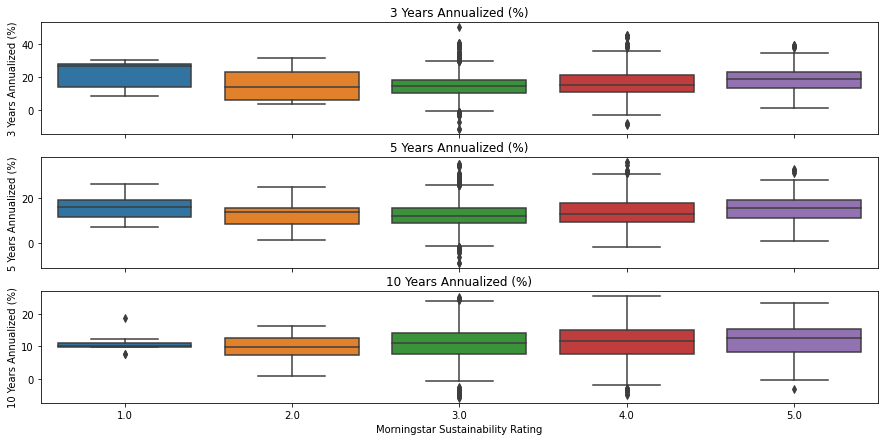

In [124]:
fig, axes = plt.subplots(3, 1, figsize=(15, 7), sharex=True)
for name, ax in zip(['3 Years Annualized (%)','5 Years Annualized (%)','10 Years Annualized (%)'], axes):
    sns.boxplot(data=dfclean, x='Morningstar Sustainability Rating', y=name, ax=ax)
    ax.set_xlabel('Morningstar Sustainability Rating')
    ax.set_ylabel(name)
    ax.set_title(name)
    # Remove the automatic x-axis label from all but the bottom subplot
    if ax != axes[-1]:
        ax.set_xlabel('')

In [125]:
dfclean.columns

Index(['Ticker', 'Morningstar Sustainability Rating', 'Yield (%)',
       'Morningstar Category', 'Portfolio Sustainability Score',
       'Portfolio Environmental Score', 'Portfolio Social Score',
       'Portfolio Governance Score', 'Sustainable Investment by Prospectus',
       'Sustainable Investment - ESG Fund', 'Portfolio E_S_G Score',
       'Sustainable Investment - Environmental Sector Fund', '% Alcohol',
       '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', '% Fossil Fuels',
       '% Small Arms', '% Thermal Coal', '% Tobacco', 'YTD Return (%)',
       '1 Year Annualized (%)', '3 Years Annualized (%)',
       '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)',
       'Equity StyleBox', 'Average Market Cap (Mil)',
       'Average Credit Quality'],
      dtype='object')

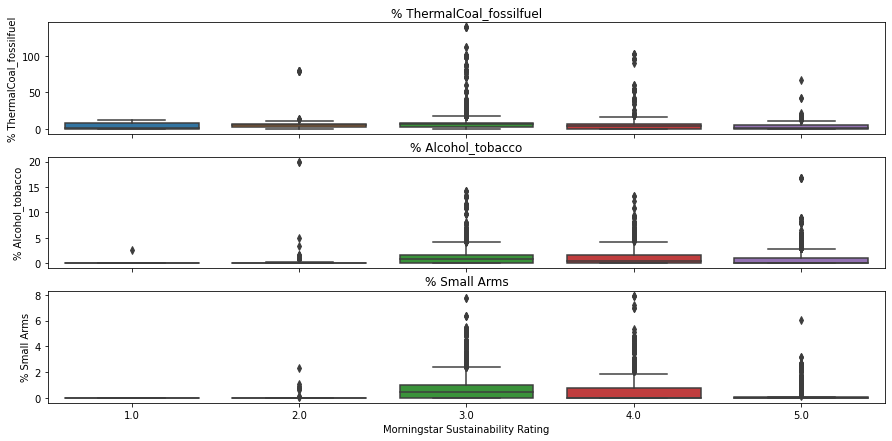

In [126]:
fig, axes = plt.subplots(3, 1, figsize=(15, 7), sharex=True)
for name, ax in zip(['% ThermalCoal_fossilfuel','% Alcohol_tobacco','% Small Arms'], axes):
    sns.boxplot(data=dfclean, x='Morningstar Sustainability Rating', y=name, ax=ax)
    ax.set_xlabel('Morningstar Sustainability Rating')
    ax.set_ylabel(name)
    ax.set_title(name)
    # Remove the automatic x-axis label from all but the bottom subplot
    if ax != axes[-1]:
        ax.set_xlabel('')

<AxesSubplot:>

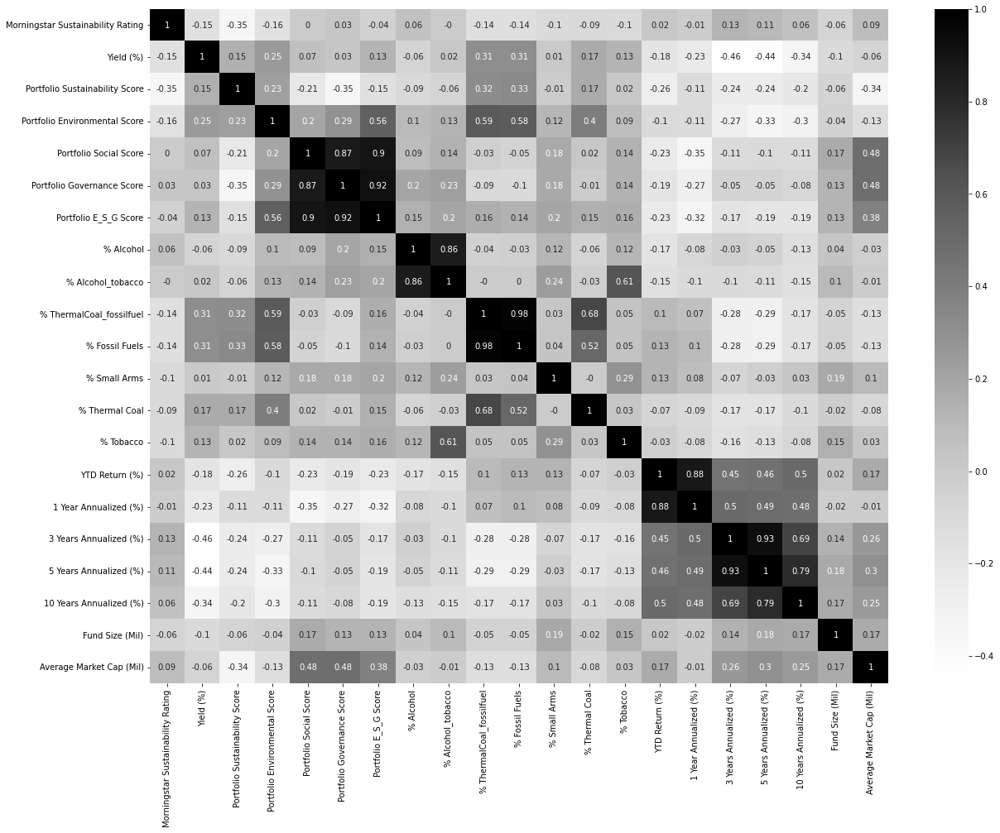

In [127]:
#df.corr(cmap='Greys').round(2)
plt.figure(figsize = (20,15))
sns.heatmap(dfclean.corr().round(2),annot=True, cmap='Greys')

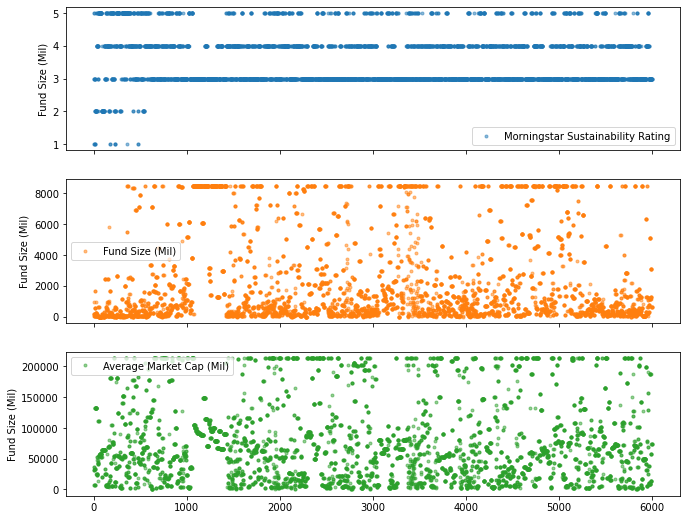

In [128]:
cols_plot = ['Morningstar Sustainability Rating', 'Fund Size (Mil)', 'Equity StyleBox',
             'Average Market Cap (Mil)', 'Average Credit Quality']
axes = dfclean[cols_plot].plot(marker='.', alpha=0.5,
                           linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Fund Size (Mil)')

In [130]:
dfclean.shape

(6003, 28)

## **9. Summarization**
---

- **<h4>Conclusion</h4>**

  - The data has **helped** us to **understand** the **investment opportunities**.

  - A total of **6003 data records** based on the **environmental , social and governance categories**.

  - The **Large cap leads** in terms of fund value.
  
  - The following set of **parameters** are found to be **affecting investment** the most:
    - Fossil fuels,
    - Tobacco,
    - Alcohol,
    - Thermal Coal


-  **<h4>Actionable Insights</h4>**

  - There should be an **awareness program** about environmental , social and governance responsibiities at regular periods.

  - Sustainable **investment** is an **investing  discipline** that considers environment, social and governance criteria
    to generate long term competitive financial returns and positive social impact.
 

## **10. Model Building**

Let's start with Logistic Regression - the basic model


###  Logistic Regression
 

In [131]:
grmds = dfclean.copy()
print(grmds.shape)
grmds.head()

(6003, 28)


,Ticker,Morningstar Sustainability Rating,Yield (%),Morningstar Category,Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
0,AWPCX,3.0,0.00,Global Equity Large Cap,20.67,4.21,8.13,6.92,Yes,Yes,19.26,No,0.0,0.0,5.63,3.73,0.0,1.90,0.0,8.22,24.74,19.32,12.27,7.50,941.47,Large Growth,32187.09,BBB
1,STHAX,5.0,0.67,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,18.28,No,0.0,0.0,10.49,8.24,0.0,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,Large Core,32187.09,BBB
2,STHYX,5.0,0.67,US Fixed Income,21.27,3.39,8.11,6.78,Yes,Yes,18.28,No,0.0,0.0,10.49,8.24,0.0,2.25,0.0,8.22,24.74,19.32,12.27,7.50,174.22,Large Core,32187.09,BBB
3,BJBIX,3.0,0.54,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,18.52,No,0.0,0.0,4.67,2.33,0.0,2.34,0.0,11.74,34.20,16.19,11.93,6.09,146.06,Large Growth,36331.08,BBB
4,JIEIX,3.0,0.83,Global Equity Large Cap,20.99,3.31,8.61,6.60,Yes,Yes,18.52,No,0.0,0.0,4.67,2.33,0.0,2.34,0.0,11.99,34.56,16.49,12.20,6.36,146.06,Large Growth,36331.08,BBB


In [132]:
grmds.columns

Index(['Ticker', 'Morningstar Sustainability Rating', 'Yield (%)',
       'Morningstar Category', 'Portfolio Sustainability Score',
       'Portfolio Environmental Score', 'Portfolio Social Score',
       'Portfolio Governance Score', 'Sustainable Investment by Prospectus',
       'Sustainable Investment - ESG Fund', 'Portfolio E_S_G Score',
       'Sustainable Investment - Environmental Sector Fund', '% Alcohol',
       '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', '% Fossil Fuels',
       '% Small Arms', '% Thermal Coal', '% Tobacco', 'YTD Return (%)',
       '1 Year Annualized (%)', '3 Years Annualized (%)',
       '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)',
       'Equity StyleBox', 'Average Market Cap (Mil)',
       'Average Credit Quality'],
      dtype='object')

### **10.1  Preparing X and y**

In [133]:
# Split the y variable series and x variables dataset
X = grmds.drop(['Morningstar Sustainability Rating','Ticker', 'Morningstar Category'],axis=1)
y = grmds['Morningstar Sustainability Rating']
print(X.shape, y.shape)

(6003, 25) (6003,)


In [134]:
numfinal = [col for col in X.columns if (X[col].dtype != "object") & (X[col].dtype != "datetime64[ns]")]
print("No and Numerical Columns : ", len(numfinal),numfinal)
print()

catfinal = [col for col in X.columns if X[col].dtype == "object"]
print("No and new categorical Columns : ", len(catfinal),catfinal)
print()

datecols = [col for col in X.columns if X[col].dtype == "datetime64[ns]"]
print("No and Date Columns : ", len(datecols),datecols)
print()

No and Numerical Columns :  20 ['Yield (%)', 'Portfolio Sustainability Score', 'Portfolio Environmental Score', 'Portfolio Social Score', 'Portfolio Governance Score', 'Portfolio E_S_G Score', '% Alcohol', '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', '% Fossil Fuels', '% Small Arms', '% Thermal Coal', '% Tobacco', 'YTD Return (%)', '1 Year Annualized (%)', '3 Years Annualized (%)', '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)', 'Average Market Cap (Mil)']

No and new categorical Columns :  5 ['Sustainable Investment by Prospectus', 'Sustainable Investment - ESG Fund', 'Sustainable Investment - Environmental Sector Fund', 'Equity StyleBox', 'Average Credit Quality']

No and Date Columns :  0 []



### **10.2 Splitting X and y into training and test data sets**

In [135]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
print(X_train.shape, X_test.shape)
print(y_train.shape,y_test.shape)

(4802, 25) (1201, 25)
(4802,) (1201,)


###  **10.3  Encoding the categorical columns**

In [136]:
# performing categorical variable to numeric variable with label encoder to make uniform data
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
X_train['Sustainable Investment by Prospectus']= le.fit_transform(X_train['Sustainable Investment by Prospectus'])
X_train['Sustainable Investment - ESG Fund']= le.fit_transform(X_train['Sustainable Investment - ESG Fund'])
X_train['Sustainable Investment - Environmental Sector Fund']= le.fit_transform(X_train['Sustainable Investment - Environmental Sector Fund'])
X_train['Equity StyleBox']= le.fit_transform(X_train['Equity StyleBox'])
X_train['Average Credit Quality']= le.fit_transform(X_train['Average Credit Quality'])

In [137]:
X_test['Sustainable Investment by Prospectus']= le.fit_transform(X_test['Sustainable Investment by Prospectus'])
X_test['Sustainable Investment - ESG Fund']= le.fit_transform(X_test['Sustainable Investment - ESG Fund'])
X_test['Sustainable Investment - Environmental Sector Fund']= le.fit_transform(X_test['Sustainable Investment - Environmental Sector Fund'])
X_test['Equity StyleBox']= le.fit_transform(X_test['Equity StyleBox'])
X_test['Average Credit Quality']= le.fit_transform(X_test['Average Credit Quality'])

In [138]:
X_train.head()

,Yield (%),Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
4382,0.22,22.23,4.62,8.45,7.21,0,0,20.28,0,3.04,3.04,7.01,7.01,2.62,0.00,0.00,-1.27,17.01,13.62,10.20,6.33,8478.3925,1,61475.33,5
2403,0.00,24.43,3.54,11.11,8.48,0,0,23.13,0,2.86,2.86,0.00,0.00,0.00,0.00,0.00,-22.12,-19.21,12.75,13.25,9.68,183.3900,1,64782.00,0
2442,0.85,23.01,4.92,10.36,7.45,0,0,22.73,0,0.00,1.72,16.64,13.17,1.07,3.47,1.72,15.20,19.36,12.14,10.64,11.64,2769.8600,2,90096.52,0
5832,4.58,32.89,11.13,8.09,5.33,0,0,24.55,0,0.00,0.00,3.48,3.17,0.00,0.31,0.00,3.31,5.80,7.62,4.03,2.18,108.1700,0,69926.53,1
1642,2.48,20.72,4.52,8.55,7.49,0,0,20.56,0,1.75,4.50,8.77,8.28,0.76,0.49,2.75,7.32,12.65,10.05,8.38,8.01,1163.2500,0,43017.91,5


In [139]:
X_test.head()

,Yield (%),Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
5216,0.58,20.44,2.88,10.37,7.19,0,0,20.44,0,0.00,0.00,3.61,3.61,0.00,0.00,0.00,26.34,45.70,21.98,18.68,14.86,82.6000,0,213085.6925,5
3237,0.72,24.61,4.15,7.52,5.55,0,0,17.22,0,0.28,0.40,9.51,7.88,0.00,1.63,0.12,20.93,47.79,17.01,15.89,13.29,2286.6200,6,6486.2000,0
3265,0.00,21.11,3.08,8.79,7.21,0,0,19.08,0,1.05,1.15,2.23,1.90,1.68,0.33,0.10,18.70,37.72,23.15,19.61,14.16,3235.7800,1,100390.1700,4
1410,0.84,20.56,0.49,14.09,5.98,0,0,20.56,0,0.00,0.00,0.30,0.15,0.00,0.15,0.00,-0.56,-0.51,5.23,3.14,2.25,8478.3925,0,90305.3000,2
3508,0.87,21.93,4.64,9.28,7.72,0,0,21.64,0,1.40,5.99,7.17,7.17,1.83,0.00,4.59,11.67,26.51,11.80,8.85,8.16,8478.3925,0,57063.4000,1


### **10.4 Scaling**

In [140]:
numeric_features = X_train[['Yield (%)', 'Portfolio Sustainability Score',
                            'Portfolio Environmental Score', 'Portfolio Social Score',
                            'Portfolio Governance Score', 'Portfolio E_S_G Score', '% Alcohol',
                            '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', '% Fossil Fuels', '% Small Arms',
                            '% Thermal Coal', '% Tobacco', 'YTD Return (%)', '1 Year Annualized (%)', '3 Years Annualized (%)',
                            '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)', 'Average Market Cap (Mil)']].columns
numeric_features

Index(['Yield (%)', 'Portfolio Sustainability Score',
       'Portfolio Environmental Score', 'Portfolio Social Score',
       'Portfolio Governance Score', 'Portfolio E_S_G Score', '% Alcohol',
       '% Alcohol_tobacco', '% ThermalCoal_fossilfuel', '% Fossil Fuels',
       '% Small Arms', '% Thermal Coal', '% Tobacco', 'YTD Return (%)',
       '1 Year Annualized (%)', '3 Years Annualized (%)',
       '5 Years Annualized (%)', '10 Years Annualized (%)', 'Fund Size (Mil)',
       'Average Market Cap (Mil)'],
      dtype='object')

In [141]:
sc = StandardScaler() 
X_train[numeric_features] = sc.fit_transform(X_train[numeric_features])
X_train.head()

,Yield (%),Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
4382,-0.561376,-0.041839,0.588102,-0.051512,0.448906,0,0,0.343020,0,1.564622,1.012890,0.006078,0.113411,2.062342,-0.388646,-0.512010,-1.441728,-0.555261,-0.298587,-0.453585,-0.939542,2.030339,1,-0.222716,5
2403,-0.733251,0.734000,-0.126362,1.136063,1.253867,0,0,1.002738,0,1.442154,0.913655,-0.604932,-0.595612,-0.641094,-0.388646,-0.512010,-3.543101,-2.730090,-0.417637,0.024038,-0.261747,-0.740098,1,-0.170839,0
2442,-0.069188,0.233231,0.786565,0.801220,0.601025,0,0,0.910146,0,-0.503715,0.285168,0.845454,0.736462,0.462981,0.893842,1.392565,0.218206,-0.414155,-0.501109,-0.384682,0.134814,0.123754,2,0.226313,0
5832,2.844874,3.717455,4.894737,-0.212236,-0.742689,0,0,1.331440,0,-0.503715,-0.663077,-0.301606,-0.274984,-0.641094,-0.274072,-0.512010,-0.980131,-1.228365,-1.119622,-1.419793,-1.779198,-0.765221,0,-0.090128,1
1642,1.204249,-0.574347,0.521948,-0.006866,0.626378,0,0,0.407834,0,0.686940,1.817795,0.159484,0.241865,0.143109,-0.207545,2.533096,-0.575982,-0.817057,-0.787103,-0.738593,-0.599633,-0.412836,0,-0.512289,5


In [142]:
X_test[numeric_features] = sc.transform(X_test[numeric_features])
X_test.head()

,Yield (%),Portfolio Sustainability Score,Portfolio Environmental Score,Portfolio Social Score,Portfolio Governance Score,Sustainable Investment by Prospectus,Sustainable Investment - ESG Fund,Portfolio E_S_G Score,Sustainable Investment - Environmental Sector Fund,% Alcohol,% Alcohol_tobacco,% ThermalCoal_fossilfuel,% Fossil Fuels,% Small Arms,% Thermal Coal,% Tobacco,YTD Return (%),1 Year Annualized (%),3 Years Annualized (%),5 Years Annualized (%),10 Years Annualized (%),Fund Size (Mil),Equity StyleBox,Average Market Cap (Mil),Average Credit Quality
5216,-0.280126,-0.673090,-0.562980,0.805685,0.436229,0,0,0.380057,0,-0.503715,-0.663077,-0.290275,-0.230480,-0.641094,-0.388646,-0.512010,1.340955,1.167430,0.845389,0.874363,0.786306,-0.773761,0,2.155854,5
3237,-0.170751,0.797478,0.277178,-0.466716,-0.603247,0,0,-0.365309,0,-0.313210,-0.442555,0.223984,0.201407,-0.641094,0.213791,-0.379133,0.795706,1.292924,0.165298,0.437456,0.468653,-0.037643,6,-1.085425,0
3265,-0.733251,-0.436812,-0.430671,0.100284,0.448906,0,0,0.065244,0,0.210678,-0.029076,-0.410560,-0.403437,1.092407,-0.266680,-0.401279,0.570955,0.688271,1.005491,1.019999,0.644677,0.279366,1,0.387807,4
1410,-0.077001,-0.630771,-2.144064,2.466504,-0.330702,0,0,0.407834,0,-0.503715,-0.663077,-0.578783,-0.580440,-0.641094,-0.333207,-0.512010,-1.370170,-1.607249,-1.446668,-1.559165,-1.765035,2.030339,0,0.229589,2
3508,-0.053563,-0.147635,0.601333,0.319047,0.772158,0,0,0.657833,0,0.448809,2.639240,0.020024,0.129595,1.247184,-0.388646,4.570549,-0.137566,0.015167,-0.547634,-0.664992,-0.569284,2.030339,0,-0.291934,1


In [143]:
gc.collect()

120034

### **10.5 Using  the Logistic Regression  model**

In [144]:
# Defining the model
lr = LogisticRegression(random_state=0)

In [145]:
# Training the model:
lr.fit(X_train, y_train)
lr

LogisticRegression(random_state=0)

###  **10.6  Examine Coefs**

In [146]:
lr_coefs = [(col, coef) for col, coef in zip(X_train.columns[1:], lr.coef_[0])]
sorted(lr_coefs, key = lambda x: -x[1])

[('3 Years Annualized (%)', 1.0439812849663241),
 ('% Alcohol', 0.9853442402621129),
 ('Portfolio Environmental Score', 0.6573387586678866),
 ('Portfolio E_S_G Score', 0.614724566073444),
 ('Sustainable Investment - ESG Fund', 0.5371284864246203),
 ('Portfolio Sustainability Score', 0.3732645540242899),
 ('Portfolio Social Score', 0.3122767562011975),
 ('5 Years Annualized (%)', 0.24276919526514212),
 ('10 Years Annualized (%)', 0.06754149682611221),
 ('Sustainable Investment - Environmental Sector Fund', -0.00694152738008862),
 ('YTD Return (%)', -0.030339531950902058),
 ('% Alcohol_tobacco', -0.04982201172104793),
 ('1 Year Annualized (%)', -0.05140473883296863),
 ('% ThermalCoal_fossilfuel', -0.05547598726861391),
 ('Portfolio Governance Score', -0.07817193246571552),
 ('Equity StyleBox', -0.12570414362151555),
 ('Average Market Cap (Mil)', -0.1517450179439556),
 ('% Tobacco', -0.17046218411584996),
 ('Sustainable Investment by Prospectus', -0.20722199702825328),
 ('% Thermal Coal',

In [147]:
# Extract impactful columns (large coefs)
lr_coefs = [(col, coef, pos) for pos, (col, coef) in enumerate(zip(X_train.columns[1:], lr.coef_[0]))]
top_ = sorted(lr_coefs, key = lambda x: -abs(x[1]))[:15]
top_columns = [name for name, coef, pos in top_]
top_column_pos = [pos for name, coef, pos in top_]

print(top_columns, "\n")
print(top_column_pos)

['3 Years Annualized (%)', '% Alcohol', 'Average Credit Quality', '% Small Arms', 'Portfolio Environmental Score', '% Fossil Fuels', 'Portfolio E_S_G Score', 'Sustainable Investment - ESG Fund', 'Portfolio Sustainability Score', 'Fund Size (Mil)', '% Thermal Coal', 'Portfolio Social Score', '5 Years Annualized (%)', 'Sustainable Investment by Prospectus', '% Tobacco'] 

[17, 8, 23, 12, 1, 11, 6, 5, 0, 20, 13, 2, 18, 4, 14]


### **10.7  Predicting and evaluating**

In [148]:
# Predicting training and testing labels
y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)
y_test_prob = lr.predict_proba(X_test)

In [149]:
y_test_prob = [x[1] for x in y_test_prob]
print("Y predicted : ",y_test_pred)
print("Y probability predicted : ",y_test_prob[:5])

Y predicted :  [3. 3. 3. ... 3. 3. 3.]
Y probability predicted :  [0.00013956749938222332, 5.843361897725488e-05, 3.0722298868614754e-05, 8.538403208294119e-06, 8.679112187474203e-05]


In [150]:
print('                    Training Data Report          ')
print("Accuracy score of Training Data  is ", accuracy_score(y_train, y_train_pred))
print("\n Confusion Matrix of Training Data: \n",confusion_matrix(y_train, y_train_pred))
print("\n Classification Report of  Training Data : \n",classification_report(y_train, y_train_pred))
print('                    Test Validation Data Report           ')
print("Accuracy score of Testing Data  is ", accuracy_score(y_test, y_test_pred))
print("\n Confusion Matrix of Testing Data: \n",confusion_matrix(y_test, y_test_pred))
print("\n Classification Report of  Testing Data : \n",classification_report(y_test, y_test_pred))

                    Training Data Report          
Accuracy score of Training Data  is  0.6541024573094544

 Confusion Matrix of Training Data: 
 [[   3    1    4    1    3]
 [   1   39    4   20    1]
 [   1    5 2498  189   77]
 [   4    1  904  375  108]
 [   0    0  165  172  226]]

 Classification Report of  Training Data : 
               precision    recall  f1-score   support

         1.0       0.33      0.25      0.29        12
         2.0       0.85      0.60      0.70        65
         3.0       0.70      0.90      0.79      2770
         4.0       0.50      0.27      0.35      1392
         5.0       0.54      0.40      0.46       563

    accuracy                           0.65      4802
   macro avg       0.58      0.48      0.52      4802
weighted avg       0.62      0.65      0.62      4802

                    Test Validation Data Report           
Accuracy score of Testing Data  is  0.649458784346378

 Confusion Matrix of Testing Data: 
 [[  0   0   1   0   0]
 [  

### **10.8 Using  the  Random Forest  model**

In [151]:
# Define the model
rf = RandomForestClassifier(random_state=0, n_jobs = -1)
# Train the model
rf.fit(X_train,y_train)
rf

RandomForestClassifier(n_jobs=-1, random_state=0)

In [152]:
# Predicting training and testing labels
y_train_pred_rf = rf.predict(X_train)
y_pred_rf = rf.predict(X_test)
y_prob_pred_rf = rf.predict_proba(X_test)
y_prob_pred_rf = [x[1] for x in y_prob_pred_rf]
print("Y predicted : ", y_pred_rf)
print("Y probability predicted : ", y_prob_pred_rf[:5])

Y predicted :  [4. 3. 3. ... 3. 3. 3.]
Y probability predicted :  [0.0, 0.0, 0.0, 0.0, 0.0]


In [153]:
print('                    Training Data Report          ')
print("Accuracy score of Training Data  is ", accuracy_score(y_train, y_train_pred_rf))
print("\n Confusion Matrix of Training Data: \n",confusion_matrix(y_train, y_train_pred_rf))
print("\n Classification Report of Training Data : \n",classification_report(y_train, y_train_pred_rf))
print('                    Test Validation Data Report           ')
print("Accuracy score of Testing Data  is ", accuracy_score(y_test, y_pred_rf))
print("\n Confusion Matrix of Testing Data: \n",confusion_matrix(y_test, y_pred_rf))
print("\n Classification Report of Testing Data : \n",classification_report(y_test, y_pred_rf))

                    Training Data Report          
Accuracy score of Training Data  is  1.0

 Confusion Matrix of Training Data: 
 [[  12    0    0    0    0]
 [   0   65    0    0    0]
 [   0    0 2770    0    0]
 [   0    0    0 1392    0]
 [   0    0    0    0  563]]

 Classification Report of Training Data : 
               precision    recall  f1-score   support

         1.0       1.00      1.00      1.00        12
         2.0       1.00      1.00      1.00        65
         3.0       1.00      1.00      1.00      2770
         4.0       1.00      1.00      1.00      1392
         5.0       1.00      1.00      1.00       563

    accuracy                           1.00      4802
   macro avg       1.00      1.00      1.00      4802
weighted avg       1.00      1.00      1.00      4802

                    Test Validation Data Report           
Accuracy score of Testing Data  is  0.9600333055786844

 Confusion Matrix of Testing Data: 
 [[  1   0   0   0   0]
 [  0  13   0   0  

In [154]:
# Instantiating a standard scaler
sc = StandardScaler()

# Scaling the features
sc.fit_transform(X_train)

# Instantiating various classifiers
clfs = [KNeighborsClassifier(),
        RandomForestClassifier(random_state=0, class_weight='balanced'),
        GaussianNB(),
        LGBMClassifier()
        ]

for clf in clfs:
    # Extracting model name
    model_name = type(clf).__name__

    # Fit the model on train data
    clf.fit(X_train, y_train)

    # Make predictions using test data
    y_pred_train = clf.predict(X_train)

    # Make predictions using test data
    y_pred_test = clf.predict(X_test)

    # Make predictions probability using test data
    y_prob_pred = clf.predict_proba(X_test)

    # Calculate the train accuracy of the model
    clf_trainacc = accuracy_score(y_train, y_pred_train)

    # Calculate the test accuracy of the model
    clf_testacc = accuracy_score(y_test, y_pred_test)

    # Calculate the f1 core of the testing data
    scoresclf = cross_val_score(clf, X_train, y_train, cv=10, scoring='f1_weighted')
    
    # Display the accuracy of the model
    print('Performance Metric of', model_name, ':')
    print('[Train Accuracy]:', clf_trainacc)
    print('[Test Accuracy]:', clf_testacc)
    print('[Test F1 Scores are ]:', scoresclf)
    print("Average  Test F1 score : ", np.mean(scoresclf))
    print("\n Confusion Matrix of Testing Data: \n", confusion_matrix(y_test, y_pred_test))
    print("\n Classification Report of Testing Data : \n", classification_report(y_test, y_pred_test))
    print('----------------------------------------\n')    

Performance Metric of KNeighborsClassifier :
[Train Accuracy]: 0.9192003331945023
[Test Accuracy]: 0.8492922564529559
[Test F1 Scores are ]: [0.83442535 0.8363228  0.85676031 0.82824128 0.83867493 0.82144869
 0.88455085 0.85774955 0.85911339 0.83666685]
Average  Test F1 score :  0.8453954001211124

 Confusion Matrix of Testing Data: 
 [[  1   0   0   0   0]
 [  0   9   1   2   1]
 [  0   1 639  50  10]
 [  0   4  69 269  12]
 [  0   1   7  23 102]]

 Classification Report of Testing Data : 
               precision    recall  f1-score   support

         1.0       1.00      1.00      1.00         1
         2.0       0.60      0.69      0.64        13
         3.0       0.89      0.91      0.90       700
         4.0       0.78      0.76      0.77       354
         5.0       0.82      0.77      0.79       133

    accuracy                           0.85      1201
   macro avg       0.82      0.83      0.82      1201
weighted avg       0.85      0.85      0.85      1201

--------------

In [155]:
## **10.9 Results**

In [156]:
print("KNeighborsClassifier Testing Accuracy : 0.85 ")
print("RandomForestClassifier TestingAccuracy : 0.96")
print("GaussianNB Testing Accuracy : 0.58 ")
print("LGBMClassifier Testing Accuracy : 0.96 ")
print("Logistic Regression Testing Accuracy: 0.65 ")

KNeighborsClassifier Testing Accuracy : 0.85 
RandomForestClassifier TestingAccuracy : 0.96
GaussianNB Testing Accuracy : 0.58 
LGBMClassifier Testing Accuracy : 0.96 
Logistic Regression Testing Accuracy: 0.65 


- Random Forest Classifier gives us the best training accuracy of 96%